# **Features Dashboard**

Here is where all post-processing of Landscape Analysis results takes place.


# Initialisation & Results Import


In [82]:
%load_ext autoreload
%autoreload 2

# Package import
from FeaturesDashboard import FeaturesDashboard
import copy
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [83]:
# Ensure problem name (dictionary key) matches the name in the selected results folder (dictionary value).
results_dict = {
    "CTP1_d5": ["Feb20_1433"],
    "CTP2_d5": ["Feb20_1433"],
    "CTP3_d5": ["Feb20_1433"],
    "CTP4_d5": ["Feb20_1433"],
    "CTP5_d5": ["Feb20_1433"],
    "CTP6_d5": ["Feb20_1433"],
    "CTP7_d5": ["Feb20_1433"],
    "CTP8_d5": ["Feb20_1433"],
    "MW1_d5": ["Feb15_1352"],
    "MW2_d5": ["Feb15_1352"],
    "MW3_d5": ["Feb15_1352"],
    "MW4_d5": ["Feb15_1352"],
    "MW5_d5": ["Feb15_1352"],
    "MW6_d5": ["Feb15_1352"],
    "MW7_d5": ["Feb15_1352"],
    "MW8_d5": ["Feb15_1352"],
    "MW9_d5": ["Feb15_1352"],
    "MW10_d5": ["Feb15_1352"],
    "MW11_d5": ["Feb15_1352"],
    "MW12_d5": ["Feb15_1352"],
    "MW13_d5": ["Feb15_1352"],
    "MW14_d5": ["Feb15_1352"],
    "DASCMOP1_d5": ["Feb21_1809"],
    "DASCMOP2_d5": ["Feb21_1809"],
    "DASCMOP3_d5": ["Feb21_1809"],
    "DASCMOP4_d5": ["Feb21_1809"],
    "DASCMOP5_d5": ["Feb21_1809"],
    "DASCMOP6_d5": ["Feb21_1809"],
    "DASCMOP7_d5": ["Feb21_1809"],
    "DASCMOP8_d5": ["Feb21_1809"],
    "DASCMOP9_d5": ["Feb21_1809"],
    "LIRCMOP1_d5": ["Mar17_1935"],
    "LIRCMOP2_d5": ["Mar17_1935"],
    "LIRCMOP3_d5": ["Mar17_1935"],
    "LIRCMOP4_d5": ["Mar17_1935"],
    "LIRCMOP5_d5": ["Mar04_1551"],
    "LIRCMOP6_d5": ["Mar04_1551"],
    "LIRCMOP7_d5": ["Mar04_1551"],
    "LIRCMOP8_d5": ["Mar04_1551"],
    "LIRCMOP9_d5": ["Mar04_1551"],
    "LIRCMOP10_d5": ["Mar04_1551"],
    "LIRCMOP11_d5": ["Mar04_1551"],
    "LIRCMOP12_d5": ["Mar04_1551"],
    "LIRCMOP13_d5": ["Mar04_1551"],
    "LIRCMOP14_d5": ["Mar04_1551"],
    "DC1DTLZ1_d5": ["Feb21_1809"],
    "DC1DTLZ3_d5": ["Feb21_1809"],
    "DC2DTLZ1_d5": ["Feb21_1809"],
    "DC2DTLZ3_d5": ["Feb21_1809"],
    "DC3DTLZ1_d5": ["Feb21_1809"],
    "DC3DTLZ3_d5": ["Feb21_1809"],
    "C1DTLZ1_d5": ["Feb21_1809"],
    "C1DTLZ3_d5": ["Feb21_1809"],
    "C2DTLZ2_d5": ["Feb21_1809"],
    "C3DTLZ1_d5": ["Feb21_1809"],
    "C3DTLZ4_d5": ["Feb21_1809"],
    "CTP1_d10": ["Feb21_1809"],
    "CTP2_d10": ["Feb21_1809"],
    "CTP3_d10": ["Feb21_1809"],
    "CTP4_d10": ["Feb21_1809"],
    "CTP5_d10": ["Feb21_1809"],
    "CTP6_d10": ["Feb21_1809"],
    "CTP7_d10": ["Feb21_1809"],
    "CTP8_d10": ["Feb21_1809"],
    "MW1_d10": ["Feb21_1809"],
    "MW2_d10": ["Feb21_1809"],
    "MW3_d10": ["Feb21_1809"],
    "MW4_d10": ["Feb21_1809"],
    "MW5_d10": ["Feb21_1809"],
    "MW6_d10": ["Feb21_1809"],
    "MW7_d10": ["Feb21_1809"],
    "MW8_d10": ["Feb21_1809"],
    "MW9_d10": ["Feb21_1809"],
    "MW10_d10": ["Feb21_1809"],
    "MW11_d10": ["Feb21_1809"],
    "MW12_d10": ["Feb21_1809"],
    "MW13_d10": ["Feb21_1809"],
    "MW14_d10": ["Feb21_1809"],
    "DASCMOP1_d10": ["Feb21_1809"],
    "DASCMOP2_d10": ["Feb21_1809"],
    "DASCMOP3_d10": ["Feb21_1809"],
    "DASCMOP4_d10": ["Feb21_1809"],
    "DASCMOP5_d10": ["Feb21_1809"],
    "DASCMOP6_d10": ["Feb21_1809"],
    "DASCMOP7_d10": ["Feb21_1809"],
    "DASCMOP8_d10": ["Feb21_1809"],
    "DASCMOP9_d10": ["Feb21_1809"],
    "LIRCMOP1_d10": ["Mar04_1551"],
    "LIRCMOP2_d10": ["Mar04_1551"],
    "LIRCMOP3_d10": ["Mar04_1551"],
    "LIRCMOP4_d10": ["Mar04_1551"],
    "LIRCMOP5_d10": ["Mar04_1551"],
    "LIRCMOP6_d10": ["Mar04_1551"],
    "LIRCMOP7_d10": ["Mar04_1551"],
    "LIRCMOP8_d10": ["Mar04_1551"],
    "LIRCMOP9_d10": ["Mar04_1551"],
    "LIRCMOP10_d10": ["Mar04_1551"],
    "LIRCMOP11_d10": ["Mar04_1551"],
    "LIRCMOP12_d10": ["Mar04_1551"],
    "LIRCMOP13_d10": ["Mar05_1149"],
    "LIRCMOP14_d10": ["Mar05_1149"],
    "DC1DTLZ1_d10": ["Feb21_1809"],
    "DC1DTLZ3_d10": ["Feb21_1809"],
    "DC2DTLZ1_d10": ["Feb21_1809"],
    "DC2DTLZ3_d10": ["Feb21_1809"],
    "DC3DTLZ1_d10": ["Feb22_1514"],
    "DC3DTLZ3_d10": ["Feb22_1514"],
    "C1DTLZ1_d10": ["Feb22_1514"],
    "C1DTLZ3_d10": ["Feb22_1514"],
    "C2DTLZ2_d10": ["Feb22_1514"],
    "C3DTLZ1_d10": ["Feb22_1514"],
    "C3DTLZ4_d10": ["Feb22_1514"],
    "CF1_d10": ["Mar14_0935"],
    "CF2_d10": ["Mar14_0935"],
    "CF3_d10": ["Mar14_0935"],
    "CF4_d10": ["Mar14_0935"],
    "CF5_d10": ["Mar14_0935"],
    "CF6_d10": ["Mar14_0935"],
    "CF7_d10": ["Mar14_0935"],
    "CF8_d10": None,
    "CF9_d10": None,
    "CF10_d10": None,
    "CTP1_d20": ["Feb22_1514"],
    "CTP2_d20": ["Feb22_1514"],
    "CTP3_d20": ["Feb22_1514"],
    "CTP4_d20": ["Feb22_1514"],
    "CTP5_d20": ["Feb22_1514"],
    "CTP6_d20": ["Feb22_1514"],
    "CTP7_d20": ["Feb22_1514"],
    "CTP8_d20": ["Feb22_1514"],
    "MW1_d20": ["Feb19_1450"],
    "MW2_d20": ["Feb19_1450"],
    "MW3_d20": ["Feb19_1450"],
    "MW4_d20": ["Feb19_1450"],
    "MW5_d20": ["Feb19_1450"],
    "MW6_d20": ["Feb19_1450"],
    "MW7_d20": ["Feb19_1450"],
    "MW8_d20": ["Feb19_1450"],
    "MW9_d20": ["Feb19_1450"],
    "MW10_d20": ["Feb19_1450"],
    "MW11_d20": ["Feb19_1450"],
    "MW12_d20": ["Feb22_1514"],
    "MW13_d20": ["Feb22_1514"],
    "MW14_d20": ["Feb26_1747"],
    "DASCMOP1_d20": ["Feb22_1514"],
    "DASCMOP2_d20": ["Feb22_1514"],
    "DASCMOP3_d20": ["Feb22_1514"],
    "DASCMOP4_d20": ["Feb22_1514"],
    "DASCMOP5_d20": ["Feb22_1514"],
    "DASCMOP6_d20": ["Feb22_1514"],
    "DASCMOP7_d20": ["Feb26_1747"],
    "DASCMOP8_d20": ["Feb26_1747"],
    "DASCMOP9_d20": ["Feb26_1747"],
    "LIRCMOP1_d20": ["Mar05_1149"],
    "LIRCMOP2_d20": ["Mar05_1149"],
    "LIRCMOP3_d20": ["Mar05_1149"],
    "LIRCMOP4_d20": ["Mar05_1149"],
    "LIRCMOP5_d20": ["Mar05_1149"],
    "LIRCMOP6_d20": ["Mar05_1149"],
    "LIRCMOP7_d20": ["Mar05_1149"],
    "LIRCMOP8_d20": ["Mar05_1149"],
    "LIRCMOP9_d20": ["Mar05_1149"],
    "LIRCMOP10_d20": ["Mar05_1149"],
    "LIRCMOP11_d20": ["Mar05_1149"],
    "LIRCMOP12_d20": ["Mar05_1149"],
    "LIRCMOP13_d20": ["Mar06_1820"],
    "LIRCMOP14_d20": ["Mar06_1820"],
    "DC1DTLZ1_d20": ["Feb22_1514"],
    "DC1DTLZ3_d20": ["Feb22_1514"],
    "DC2DTLZ1_d20": ["Feb22_1514"],
    "DC2DTLZ3_d20": ["Feb22_1514"],
    "DC3DTLZ1_d20": ["Feb22_1514"],
    "DC3DTLZ3_d20": ["Feb22_1514"],
    "C1DTLZ1_d20": ["Feb22_1514"],
    "C1DTLZ3_d20": ["Feb22_1514"],
    "C2DTLZ2_d20": ["Feb22_1514"],
    "C3DTLZ1_d20": ["Feb22_1514"],
    "C3DTLZ4_d20": ["Feb22_1514"],
    "CF1_d20": ["Mar14_0935"],
    "CF2_d20": ["Mar14_0935"],
    "CF3_d20": ["Mar15_1003"],
    "CF4_d20": ["Mar15_1003"],
    "CF5_d20": ["Mar15_1003"],
    "CF6_d20": ["Mar15_1003"],
    "CF7_d20": ["Mar15_1003"],
    "CF8_d20": None,
    "CF9_d20": None,
    "CF10_d20": None,
    "CS1_d20": ["Mar08_1604"],
    "CS2_d20": ["Mar06_1820"],
    "CS3_d20": ["Mar08_1604"],
    "CS4_d20": ["Mar08_1604"],
    "CT1_d20": ["Mar08_1604"],
    "CT2_d20": ["Mar08_1604"],
    "CT3_d20": ["Mar08_1604"],
    "CT4_d20": ["Mar08_1604"],
    "CTSE1_d20": ["Mar08_1604"],
    "CTSE2_d20": ["Mar11_1631"],
    "CTSE3_d20": ["Mar11_1631"],
    "CTSE4_d20": ["Mar11_1631"],
    "CTSEI1_d20": ["Mar11_1631"],
    "CTSEI2_d20": ["Mar11_1631"],
    "CTSEI3_d20": ["Mar11_1631"],
    "CTSEI4_d20": ["Mar12_2241"],
    "CTP1_d30": ["Feb26_1747"],
    "CTP2_d30": ["Feb26_1747"],
    "CTP3_d30": ["Feb26_1747"],
    "CTP4_d30": ["Feb26_1747"],
    "CTP5_d30": ["Feb26_1747"],
    "CTP6_d30": ["Feb26_1747"],
    "CTP7_d30": ["Feb26_1747"],
    "CTP8_d30": ["Feb26_1747"],
    "MW1_d30": ["Feb26_1747"],
    "MW2_d30": ["Feb26_1747"],
    "MW3_d30": ["Feb26_1747"],
    "MW4_d30": ["Feb26_1747"],
    "MW5_d30": ["Feb26_1747"],
    "MW6_d30": ["Feb26_1747"],
    "MW7_d30": ["Feb26_1747"],
    "MW8_d30": ["Feb26_1747"],
    "MW9_d30": ["Feb26_1747"],
    "MW10_d30": ["Feb26_1747"],
    "MW11_d30": ["Feb26_1747"],
    "MW12_d30": ["Feb28_2111"],
    "MW13_d30": ["Feb28_2111"],
    "MW14_d30": ["Feb28_2111"],
    "DASCMOP1_d30": ["Feb28_2111"],
    "DASCMOP2_d30": ["Feb28_2111"],
    "DASCMOP3_d30": ["Feb28_2111"],
    "DASCMOP4_d30": ["Feb28_2111"],
    "DASCMOP5_d30": ["Feb28_2111"],
    "DASCMOP6_d30": ["Feb28_2111"],
    "DASCMOP7_d30": ["Feb28_2111"],
    "DASCMOP8_d30": ["Feb28_2111"],
    "DASCMOP9_d30": ["Feb28_2111"],
    "LIRCMOP1_d30": ["Mar06_1820"],
    "LIRCMOP2_d30": ["Mar06_1820"],
    "LIRCMOP3_d30": ["Mar06_1820"],
    "LIRCMOP4_d30": ["Mar06_1820"],
    "LIRCMOP5_d30": ["Mar06_1820"],
    "LIRCMOP6_d30": ["Mar06_1820"],
    "LIRCMOP7_d30": ["Mar06_1820"],
    "LIRCMOP8_d30": ["Mar06_1820"],
    "LIRCMOP9_d30": ["Mar06_1820"],
    "LIRCMOP10_d30": ["Mar06_1820"],
    "LIRCMOP11_d30": ["Mar06_1820"],
    "LIRCMOP12_d30": ["Mar06_1820"],
    "LIRCMOP13_d30": ["Mar06_1820"],
    "LIRCMOP14_d30": ["Mar06_1820"],
    "DC1DTLZ1_d30": ["Feb28_2111"],
    "DC1DTLZ3_d30": ["Feb28_2111"],
    "DC2DTLZ1_d30": ["Feb28_2111"],
    "DC2DTLZ3_d30": ["Feb28_2111"],
    "DC3DTLZ1_d30": ["Feb28_2111"],
    "DC3DTLZ3_d30": ["Feb28_2111"],
    "C1DTLZ1_d30": ["Feb28_2111"],
    "C1DTLZ3_d30": ["Feb28_2111"],
    "C2DTLZ2_d30": ["Feb28_2111"],
    "C3DTLZ1_d30": ["Feb28_2111"],
    "C3DTLZ4_d30": ["Feb28_2111"],
    "CF1_d30": ["Mar15_1003"],
    "CF2_d30": None,
    "CF3_d30": None,
    "CF4_d30": None,
    "CF5_d30": None,
    "CF6_d30": None,
    "CF7_d30": None,
    "CF8_d30": None,
    "CF9_d30": None,
    "CF10_d30": None,
    "RWMOP1_d4": ["Mar26_1819"],
    "RWMOP2_d5": ["Mar26_1819"],
    "RWMOP3_d3": ["Mar26_1819"],
    "RWMOP4_d4": ["Mar26_1819"],
    "RWMOP5_d4": ["Mar26_1819"],
    "RWMOP6_d7": ["Mar26_1819"],
    "RWMOP7_d4": ["Mar26_1819"],
    "RWMOP8_d7": ["Mar26_1819"],
    "RWMOP9_d4": ["Mar26_1819"],
    "RWMOP10_d2": ["Mar26_1819"],
    "RWMOP11_d3": ["Mar26_1819"],
    "RWMOP12_d4": ["Mar26_1819"],
    "RWMOP13_d7": ["Mar26_1819"],
    "RWMOP14_d5": ["Mar26_1819"],
    "RWMOP15_d3": ["Mar26_1819"],
    "RWMOP16_d2": ["Mar26_1819"],
    "RWMOP17_d6": ["Mar26_1819"],
    "RWMOP18_d3": ["Mar26_1819"],
    "RWMOP19_d10": ["Mar26_1819"],
    "RWMOP20_d4": ["Mar26_1819"],
    "RWMOP21_d6": ["Mar26_1819"],
    "RWMOP22_d9": ["Mar26_1819"],
    "RWMOP23_d6": ["Mar26_1819"],
    "RWMOP24_d9": ["Apr11_1328"],
    "RWMOP25_d2": ["Apr11_1328"],
    "RWMOP26_d3": ["Apr11_1328"],
    "RWMOP27_d3": ["Apr11_1328"],
    "RWMOP28_d7": ["Apr11_1328"],
    "RWMOP29_d7": ["Apr11_1328"],
    "RWMOP30_d25": ["Apr11_1328"],
    "RWMOP31_d25": ["Apr11_1328"],
    "RWMOP32_d25": ["Apr11_1328"],
    "RWMOP33_d30": ["Apr17_1238"],
    "RWMOP34_d30": ["Apr13_2223"],
    "RWMOP35_d30": ["Apr14_2138"],
    "RWMOP36_d28": ["Apr14_2138"],
    "RWMOP37_d28": ["Apr14_2138"],
    "RWMOP38_d28": ["Apr14_2138"],
    "RWMOP39_d28": ["Apr17_1238"],
    "RWMOP40_d34": ["Apr19_1056"],
    "RWMOP41_d34": ["Apr30_1626"],
    "RWMOP42_d34": ["Apr30_1626"],
    "RWMOP43_d34": ["Apr30_1626"],
    "RWMOP44_d34": ["Apr30_1626"],
    "RWMOP45_d34": ["Apr30_1626"],
    "RWMOP46_d34": ["Apr30_1626"],
    "RWMOP47_d18": ["Apr19_1056"],
    "RWMOP48_d18": ["Apr19_1056"],
    "RWMOP49_d18": ["Apr19_1056"],
    "RWMOP50_d6": ["Apr19_1056"],
    "XA2_d15": ["Apr02_1903"],
    "XA3_d10": ["Apr02_1903"],
    "XA4_d10": ["Apr02_1903"],
    "XA5_d10": ["Apr02_1903"],
    "XA6_d10": ["Apr02_1903"],
    "XA7_d10": ["Apr02_1903"],
    "XA8_d10": ["Apr02_1903"],
    "XA2_d25": ["Apr10_0939"],
    "XA3_d20": ["Apr02_1919"],
    "XA4_d20": ["Apr02_1919"],
    "XA5_d20": ["Apr02_1919"],
    "XA6_d20": ["Apr10_0939"],
    "XA7_d20": ["Apr02_1919"],
    "XA8_d20": ["Apr02_1919"],
    "XA2_d35": ["Apr10_0939"],
    "XA3_d30": ["Apr05_1222"],
    "XA4_d30": ["Apr05_1222"],
    "XA5_d30": ["Apr05_1222"],
    "XA6_d30": ["Apr05_1222"],
    "XA7_d30": ["Apr05_1222"],
    "XA8_d30": ["Apr05_1222"],
}

In [84]:
# Set to true for report-compatible rendering.
report_mode = False

# Instantiate FeaturesDashboard.
dashboard = FeaturesDashboard(results_dict, "../features_results", report_mode)

# Collate all results into a single CSV.
dashboard.save_features_collated_csv()

# Map feature names with underscores to mathematical symbols. Plots will only render the mathematical symbols when report_mode is True.
dashboard.create_mapping_from_file(file_path="feature_names.txt")

Copied instance_results\Feb20_1433\CTP1_d5\CTP1_d5_aw_features.csv to ../features_results\CTP1_d5_Feb20_1433\CTP1_d5_aw_features_Feb20_1433.csv
Copied instance_results\Feb20_1433\CTP1_d5\CTP1_d5_aw_norm.csv to ../features_results\CTP1_d5_Feb20_1433\CTP1_d5_aw_norm_Feb20_1433.csv
Copied instance_results\Feb20_1433\CTP1_d5\CTP1_d5_glob_features.csv to ../features_results\CTP1_d5_Feb20_1433\CTP1_d5_glob_features_Feb20_1433.csv
Copied instance_results\Feb20_1433\CTP1_d5\CTP1_d5_glob_norm.csv to ../features_results\CTP1_d5_Feb20_1433\CTP1_d5_glob_norm_Feb20_1433.csv
Copied instance_results\Feb20_1433\CTP1_d5\CTP1_d5_rw_features.csv to ../features_results\CTP1_d5_Feb20_1433\CTP1_d5_rw_features_Feb20_1433.csv
Copied instance_results\Feb20_1433\CTP1_d5\CTP1_d5_rw_norm.csv to ../features_results\CTP1_d5_Feb20_1433\CTP1_d5_rw_norm_Feb20_1433.csv
Copied instance_results\Feb20_1433\CTP2_d5\CTP2_d5_aw_features.csv to ../features_results\CTP2_d5_Feb20_1433\CTP2_d5_aw_features_Feb20_1433.csv
Copied i

Check results importing worked.


In [85]:
dashboard.compare_results_dict_to_df()

Missing data for CF8_d10
Missing data for CF9_d10
Missing data for CF10_d10
Missing data for CF8_d20
Missing data for CF9_d20
Missing data for CF10_d20
Missing data for CF2_d30
Missing data for CF3_d30
Missing data for CF4_d30
Missing data for CF5_d30
Missing data for CF6_d30
Missing data for CF7_d30
Missing data for CF8_d30
Missing data for CF9_d30
Missing data for CF10_d30


In [86]:
# Full dataframe.
dashboard.get_landscape_features_df(give_sd=True)

,Name,Date,Suite,D,scr_glob_mean,scr_glob_std,fsr_glob_mean,fsr_glob_std,corr_obj_min_glob_mean,corr_obj_min_glob_std,...,hv_ss_avg_aw_mean,hv_ss_avg_aw_std,nhv_avg_aw_mean,nhv_avg_aw_std,hvd_avg_aw_mean,hvd_avg_aw_std,bhv_avg_aw_mean,bhv_avg_aw_std,length_avg_aw_mean,length_avg_aw_std
0,XA2_d15,Apr02_1903,XA,15,0.932444,0.002351,0.000000,0.000000,-0.273548,0.020805,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,XA3_d10,Apr02_1903,XA,10,0.629780,0.003302,0.004512,0.000679,0.439468,0.010096,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,XA4_d10,Apr02_1903,XA,10,0.860310,0.002104,0.000217,0.000331,0.211159,0.018714,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,XA5_d10,Apr02_1903,XA,10,0.611270,0.003535,0.000180,0.000258,-0.246305,0.011477,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,XA6_d10,Apr02_1903,XA,10,0.868600,0.031903,0.001474,0.000876,-0.348616,0.027840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,RWMOP19_d10,Mar26_1819,RWMOP,10,0.000000,0.000000,0.005900,0.000537,-0.002035,0.006106,...,0.543461,4.533265e-02,0.551626,4.385479e-02,8.164955e-03,2.761168e-03,0.551601,4.385851e-02,150.440000,15.202858
322,RWMOP20_d4,Mar26_1819,RWMOP,4,0.000000,0.000000,0.000975,0.000596,0.000000,0.000000,...,0.037941,1.655317e-12,0.037941,1.394971e-12,4.734713e-13,4.038566e-13,0.037941,1.395069e-12,49.792500,7.467153
323,RWMOP21_d6,Mar26_1819,RWMOP,6,0.000000,0.000000,1.000000,0.000000,-0.954831,0.001151,...,0.334646,3.334655e-03,0.340113,3.267620e-03,5.467359e-03,1.124786e-04,0.340113,3.267610e-03,1.871667,0.164663
324,RWMOP22_d9,Mar26_1819,RWMOP,9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.378889,4.399875


# Initial Exploratory Data Analysis (report section 4.1)

Includes handling of NaNs, outliers. Some features were chosen for exclusion based on this analysis.


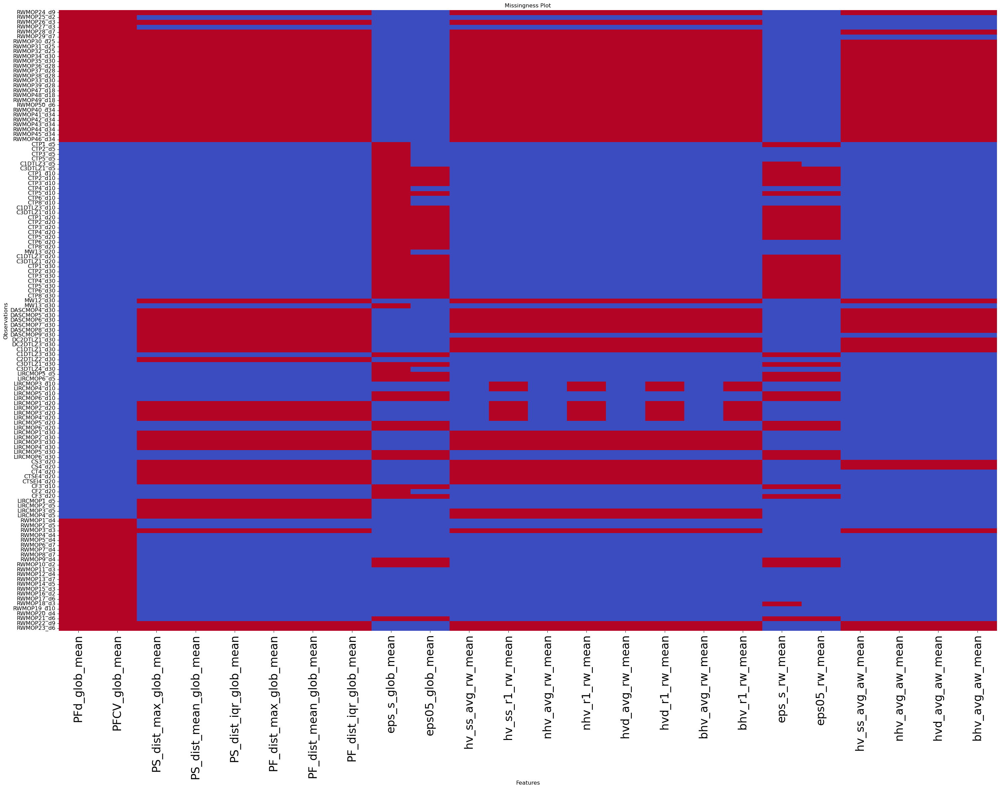

In [87]:
dashboard.plot_missingness(show_only_nans=True, ignore_aerofoils=True)

### Removing large outliers from dataset


In [88]:
# Details available in Section 4.1.2 of thesis report.
dashboard.replace_outliers_with_nan()

Column: kurt_cv_glob_mean, Suite: CF, Name: CF2_d20, Outlier Value: 7523.447288298041
Column: dist_c_avg_rw_mean, Suite: CTP, Name: CTP2_d5, Outlier Value: 13024653774495.973
Column: dist_f_c_avg_rw_mean, Suite: CTP, Name: CTP2_d5, Outlier Value: 13024653774495.98
Column: dist_c_dist_x_avg_rw_mean, Suite: CTP, Name: CTP2_d5, Outlier Value: 998838391486220.0
Column: dist_f_c_dist_x_avg_rw_mean, Suite: CTP, Name: CTP2_d5, Outlier Value: 998838391486220.4
Column: nncv_avg_rw_mean, Suite: CTP, Name: CTP2_d5, Outlier Value: 13024615984331.564
Column: ncv_avg_rw_mean, Suite: CTP, Name: CTP2_d5, Outlier Value: 37791997.45581357
Column: skew_cv_glob_mean, Suite: MW, Name: MW13_d10, Outlier Value: 79.46501301779183
Column: skew_cv_glob_mean, Suite: MW, Name: MW13_d20, Outlier Value: 97.88492332190351
Column: skew_cv_glob_mean, Suite: MW, Name: MW13_d30, Outlier Value: 102.188766761291
Column: kurt_cv_glob_mean, Suite: MW, Name: MW13_d5, Outlier Value: 2428.888832782224
Column: kurt_cv_glob_mean

### Missing value handling.

Some of these missing feature values can be replaced by appropriate values (see report section 4.1.1).


In [89]:
# Details available in Section 4.1.1 of thesis report.
feasible_hv_features = [
    "hv_ss_avg_rw_mean",
    "hv_ss_r1_rw_mean",
    "nhv_avg_rw_mean",
    "nhv_r1_rw_mean",
    "hvd_avg_rw_mean",
    "hvd_r1_rw_mean",
    "bhv_avg_rw_mean",
    "bhv_r1_rw_mean",
    "hv_ss_avg_aw_mean",
    "nhv_avg_aw_mean",
    "hvd_avg_aw_mean",
    "bhv_avg_aw_mean",
]

for f in feasible_hv_features:
    dashboard.replace_nan_with_value(column=f, value=0)

NaN values in column 'hv_ss_avg_rw_mean' have been replaced with '0'.
NaN values in column 'hv_ss_r1_rw_mean' have been replaced with '0'.
NaN values in column 'nhv_avg_rw_mean' have been replaced with '0'.
NaN values in column 'nhv_r1_rw_mean' have been replaced with '0'.
NaN values in column 'hvd_avg_rw_mean' have been replaced with '0'.
NaN values in column 'hvd_r1_rw_mean' have been replaced with '0'.
NaN values in column 'bhv_avg_rw_mean' have been replaced with '0'.
NaN values in column 'bhv_r1_rw_mean' have been replaced with '0'.
NaN values in column 'hv_ss_avg_aw_mean' have been replaced with '0'.
NaN values in column 'nhv_avg_aw_mean' have been replaced with '0'.
NaN values in column 'hvd_avg_aw_mean' have been replaced with '0'.
NaN values in column 'bhv_avg_aw_mean' have been replaced with '0'.


In [90]:
# Details available in Section 4.1.1 of thesis report.
ic_epsilon_features = [
    "eps_s_glob_mean",
    "eps05_glob_mean",
    "eps_s_rw_mean",
    "eps05_rw_mean",
]


for f in ic_epsilon_features:


    dashboard.replace_nan_with_value(column=f, value=-5)

NaN values in column 'eps_s_glob_mean' have been replaced with '-5'.
NaN values in column 'eps05_glob_mean' have been replaced with '-5'.
NaN values in column 'eps_s_rw_mean' have been replaced with '-5'.
NaN values in column 'eps05_rw_mean' have been replaced with '-5'.


As they have many missing values, we will ignore all PS-PF features for this analysis (see section 4.1.1 of report for details)


In [91]:
# Details available in Section 4.1.1 of thesis report.

features_to_ignore = [
    f

    for f in dashboard.features_df.columns

    if f.startswith(("PS", "PF")) and f not in ["Name", "Date", "D", "Suite"]
]


dashboard.append_to_features_to_ignore(features_to_ignore)

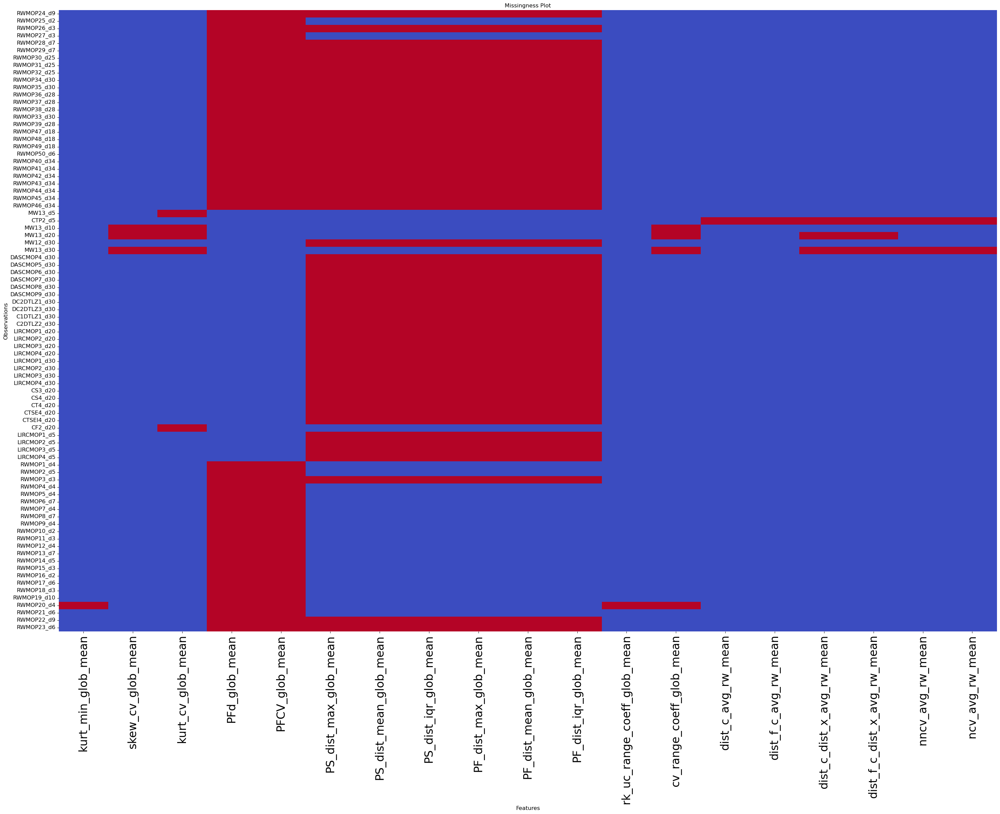

In [92]:
dashboard.plot_missingness(show_only_nans=True)

# Demonstration of some basic methods

While I did not include any of these plots in the final report, some of these functions are useful for data exploration.

Includes violin plots, pairplots and individual simulation results plots.


## Dataframe filtering


In [93]:
# Get features for specific analysis type.
global_overall_features = dashboard.get_features_for_analysis_type(
    dashboard.features_df, "glob"
)
global_overall_features

,Name,D,Suite,scr_glob_mean,fsr_glob_mean,corr_obj_min_glob_mean,corr_obj_max_glob_mean,corr_obj_range_glob_mean,skew_avg_glob_mean,skew_min_glob_mean,...,corr_obj_uc_rk_max_glob_mean,corr_cv_ranks_glob_mean,rk_uc_mdl_r2_glob_mean,rk_uc_range_coeff_glob_mean,cv_mdl_r2_glob_mean,cv_range_coeff_glob_mean,H_max_glob_mean,eps_s_glob_mean,m0_glob_mean,eps05_glob_mean
0,XA2_d15,15,XA,0.932444,0.000000,-0.273548,-0.273548,0.000000,0.010989,-0.960975,...,0.636560,0.976936,0.251174,23.220467,0.382750,-4.747081,0.851316,0.001001,0.658157,-0.747748
1,XA3_d10,10,XA,0.629780,0.004512,0.439468,0.439468,0.000000,3.218448,0.085564,...,0.835098,0.997904,0.714736,-349.276677,0.456776,-4.856814,0.839177,1.454454,0.627110,0.701702
2,XA4_d10,10,XA,0.860310,0.000217,0.211159,0.211159,0.000000,1.454597,-0.001728,...,0.763481,0.995317,0.713957,-300.478878,0.517573,-5.294144,0.841111,1.444444,0.625109,0.601602
3,XA5_d10,10,XA,0.611270,0.000180,-0.246305,-0.130537,-0.115768,0.916550,0.342698,...,0.547411,0.957514,0.393164,-41.705993,0.484072,-5.675639,0.840405,1.474474,0.621810,0.693694
4,XA6_d10,10,XA,0.868600,0.001474,-0.348616,0.008714,-0.357330,0.521872,-0.017597,...,0.571431,0.983422,0.410557,-60.666179,0.458239,-4.861538,0.852445,1.420420,0.620725,0.733734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,RWMOP19_d10,10,RWMOP,0.000000,0.005900,-0.002035,0.903347,-0.905383,1.882262,0.321895,...,0.792355,0.986328,0.771222,3.958374,0.080383,52.278194,0.830391,1.912913,0.549170,0.565566
322,RWMOP20_d4,4,RWMOP,0.000000,0.000975,0.000000,0.000000,0.000000,7.343830,-8.891586,...,0.786716,0.948576,0.617167,NaN,0.002012,NaN,0.681351,10.369369,0.661231,4.433433
323,RWMOP21_d6,6,RWMOP,0.000000,1.000000,-0.954831,-0.954831,0.000000,-0.000202,-0.017420,...,0.159079,0.000000,0.768312,-14.483188,1.000000,0.000000,0.000000,-5.000000,0.000000,-5.000000
324,RWMOP22_d9,9,RWMOP,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000982,-0.009915,...,0.675102,0.998030,0.902162,0.285141,0.893203,188.541529,0.792660,2.429429,0.500533,1.784785


In [94]:
# Get features for specific benchmark suite and/or dimensionality.
mw_features = dashboard.filter_df_by_suite_and_dim(
    dashboard.features_df, suite_names=["MW"], dims=[20], ignore_aerofoils=False
)
mw_features

,Name,Date,Suite,D,scr_glob_mean,fsr_glob_mean,corr_obj_min_glob_mean,corr_obj_max_glob_mean,corr_obj_range_glob_mean,skew_avg_glob_mean,...,inc_avg_aw_mean,lnd_avg_aw_mean,uhv_ss_avg_aw_mean,nuhv_avg_aw_mean,uhvd_avg_aw_mean,hv_ss_avg_aw_mean,nhv_avg_aw_mean,hvd_avg_aw_mean,bhv_avg_aw_mean,length_avg_aw_mean
62,MW1_d20,Feb19_1450,MW,20,0.0,0.000000,-0.359180,-0.359180,0.000000,-0.436507,...,0.024390,0.02439,0.100526,0.107254,0.006729,0.000000,0.000000,0.000000,0.000000,12.163733
63,MW2_d20,Feb19_1450,MW,20,0.0,0.000000,-0.060510,-0.060510,0.000000,0.084637,...,0.024390,0.02439,0.485315,0.500858,0.015543,0.000000,0.000000,0.000000,0.000000,66.088800
64,MW3_d20,Feb19_1450,MW,20,0.0,0.000000,-0.129963,-0.129963,0.000000,0.016885,...,0.024393,0.02439,0.479597,0.489099,0.009502,0.000293,0.000296,0.000003,0.000296,112.111200
65,MW4_d20,Feb19_1450,MW,20,0.0,0.000000,-0.664553,0.006978,-0.671531,0.659125,...,0.024390,0.02439,0.392560,0.410669,0.018109,0.000000,0.000000,0.000000,0.000000,8.210933
66,MW5_d20,Feb19_1450,MW,20,0.0,0.000000,-0.951011,-0.951011,0.000000,-0.542959,...,0.024390,0.02439,0.191298,0.201468,0.010170,0.000000,0.000000,0.000000,0.000000,26.898667
67,MW6_d20,Feb19_1450,MW,20,0.0,0.000000,-0.410883,-0.410883,0.000000,0.237562,...,0.025173,0.02439,0.840332,0.856627,0.016294,0.113096,0.113178,0.000082,0.113178,86.004533
68,MW7_d20,Feb19_1450,MW,20,0.0,0.000000,-0.516714,-0.516714,0.000000,0.000001,...,0.035191,0.02439,0.864643,0.871636,0.006993,1.055713,1.057721,0.002008,1.057721,416.862400
69,MW8_d20,Feb19_1450,MW,20,0.0,0.000000,-0.403672,0.127266,-0.530937,0.523879,...,0.025734,0.02439,0.987923,1.003277,0.015354,0.226731,0.226985,0.000254,0.226985,132.020267
70,MW9_d20,Feb19_1450,MW,20,0.0,0.000000,-0.993795,-0.993795,0.000000,0.223614,...,0.024390,0.02439,0.453396,0.469044,0.015648,0.000000,0.000000,0.000000,0.000000,96.931733
71,MW10_d20,Feb19_1450,MW,20,0.0,0.000000,-0.106031,-0.106031,0.000000,2.111958,...,0.024421,0.02439,0.972566,0.982729,0.010163,0.022457,0.022481,0.000024,0.022481,130.008000


In [95]:
# Look features for specific problem.
problem_features = dashboard.get_problem_features_samples_df("RWMOP20", "4", "glob")
problem_features

,scr,fsr,corr_obj_min,corr_obj_max,corr_obj_range,skew_avg,skew_min,skew_max,skew_rnge,kurt_avg,...,corr_obj_uc_rk_max,corr_cv_ranks,rk_uc_mdl_r2,rk_uc_range_coeff,cv_mdl_r2,cv_range_coeff,H_max,eps_s,m0,eps05
0,0.0,0.00100,0.0,0.0,0.0,63.156986,63.095277,63.218695,0.123418,3989.586212,...,0.783433,0.947374,0.618493,-5.994362e+06,0.002253,-4.150021e+17,0.689902,10.235235,0.656078,4.449449
1,0.0,0.00125,0.0,0.0,0.0,43.732894,42.024909,45.440879,3.415970,2799.112188,...,0.750540,0.953530,0.585207,-6.049032e+06,0.002690,-3.786966e+17,0.677441,10.195195,0.661581,4.429429
2,0.0,0.00125,0.0,0.0,0.0,-62.120469,-63.119668,-61.121269,1.998399,3897.432420,...,0.828504,0.944750,0.663547,-6.913435e+06,0.000824,-4.540060e+19,0.684822,9.834835,0.662081,4.449449
3,0.0,0.00225,0.0,0.0,0.0,-34.412856,-63.221828,-5.603884,57.617944,3002.282609,...,0.805990,0.950622,0.624332,-6.536641e+06,0.001368,-3.023901e+20,0.688376,10.435435,0.665583,4.469469
4,0.0,0.00025,0.0,0.0,0.0,53.505236,44.053617,62.956854,18.903237,3117.225877,...,0.780924,0.952574,0.605965,-6.129048e+06,0.002906,-7.409245e+16,0.674922,10.875876,0.663582,4.409409
5,0.0,0.00025,0.0,0.0,0.0,-62.395111,-63.191428,-61.598793,1.592635,3929.391983,...,0.782729,0.944954,0.599289,-6.571265e+06,0.000612,-4.692075e+16,0.681484,10.755756,0.649575,4.429429
6,0.0,0.00150,0.0,0.0,0.0,-21.785179,-56.674841,13.104482,69.779323,2545.224135,...,0.779750,0.954547,0.627787,-6.227085e+06,0.002327,-6.069480e+17,0.676792,10.755756,0.663832,4.429429
7,0.0,0.00100,0.0,0.0,0.0,15.587383,-22.727349,53.902116,76.629465,1908.956362,...,0.798472,0.943212,0.645708,-6.851337e+06,0.005571,-1.626014e+16,0.675009,10.135135,0.653827,4.409409
8,0.0,0.00050,0.0,0.0,0.0,37.211568,11.215372,63.207764,51.992392,3016.259053,...,0.778249,0.953625,0.600244,-6.495432e+06,-0.000239,-1.874497e+17,0.687214,10.275275,0.673587,4.409409
9,0.0,0.00050,0.0,0.0,0.0,40.957847,19.630081,62.285614,42.655533,2547.918831,...,0.778567,0.940571,0.601097,-6.237141e+06,0.001805,-5.007296e+16,0.677551,10.195195,0.662581,4.449449


## Violin plots

Violin plots with suites in the horizontal axis, markers for dimension.


Aerofoils are being ignored for analysis type: all.


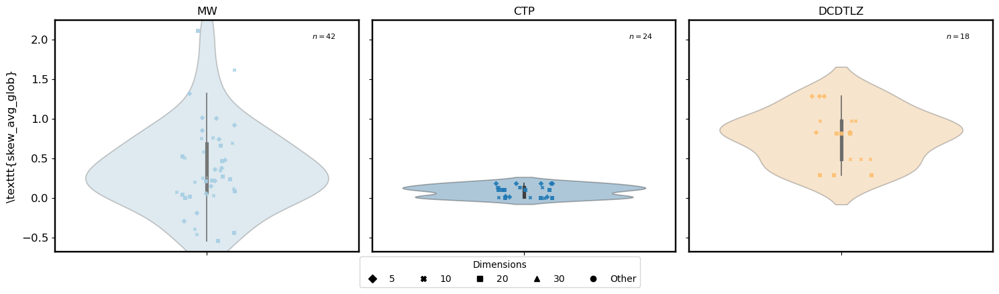

In [96]:
# Specify the feature name and the suites you're interested in
feature_name = "skew_avg_glob"  # Replace with your actual feature name (can have "_mean" included or not)
suite_names = ["MW", "CTP", "DCDTLZ"]  # Example suite names
dims = [5, 10, 20]

# Create the plots for these specific cases.
dashboard.plot_feature_across_suites(feature_name, suite_names=suite_names, dims=dims)

Aerofoils have been specified for consideration, but the dataset for all samples is being considered. Restrict to global features only.


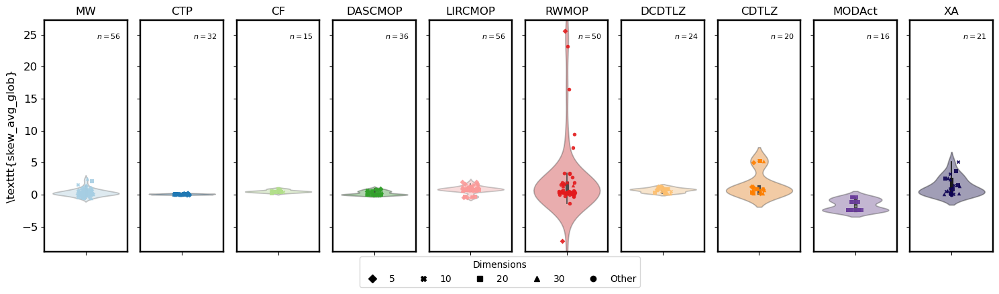

In [97]:
# Same as above but for all suites/dimensions
dashboard.plot_feature_across_suites(
    feature_name, suite_names=None, dims=None, ignore_aerofoils=False
)

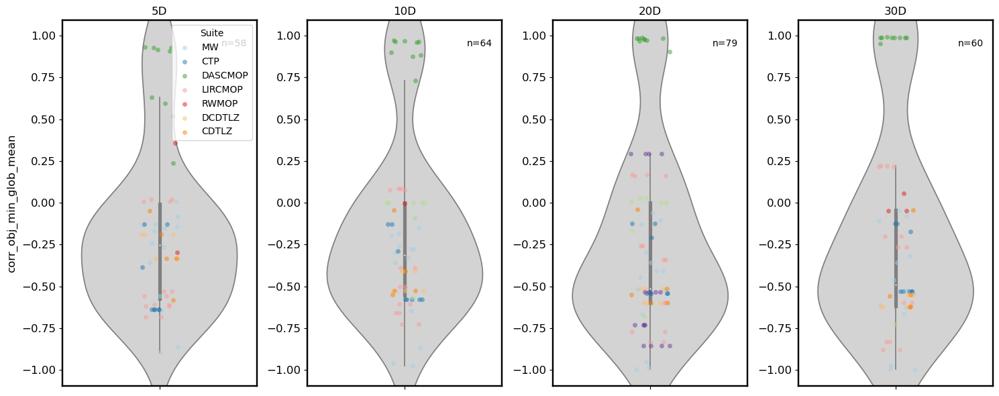

In [98]:
# Specify the feature name and the suites you're interested in
feature_name = "corr_obj_min_glob"  # Replace with your actual feature name
dims = [5, 10]  # Example dims names
suites = ["MW"]

# Create the plots
dashboard.plot_feature_across_dims(feature_name, dims=None, suite_names=None)

In [99]:
# Can create a PDF file of the features violin plots for every feature. Don't recommend running unless specifically interested.
# dashboard.generate_features_results_pdf_across_suites()

## 2D plot of feature 1 vs feature 2


Aerofoils have been specified for consideration, but the dataset for all samples is being considered. Restrict to global features only.
This dataframe contains 2 features.


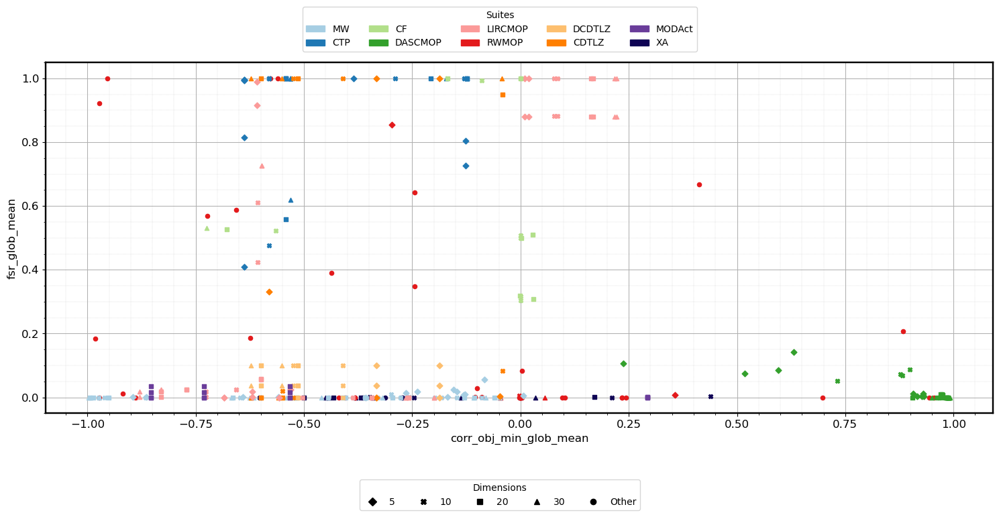

In [100]:
# Showing all suites (including aerofoils)
dashboard.plot_features_comparison(
    "corr_obj_min_glob", "fsr_glob", ignore_aerofoils=False
)

Aerofoils have been specified for consideration, but the dataset for all samples is being considered. Restrict to global features only.
This dataframe contains 2 features.


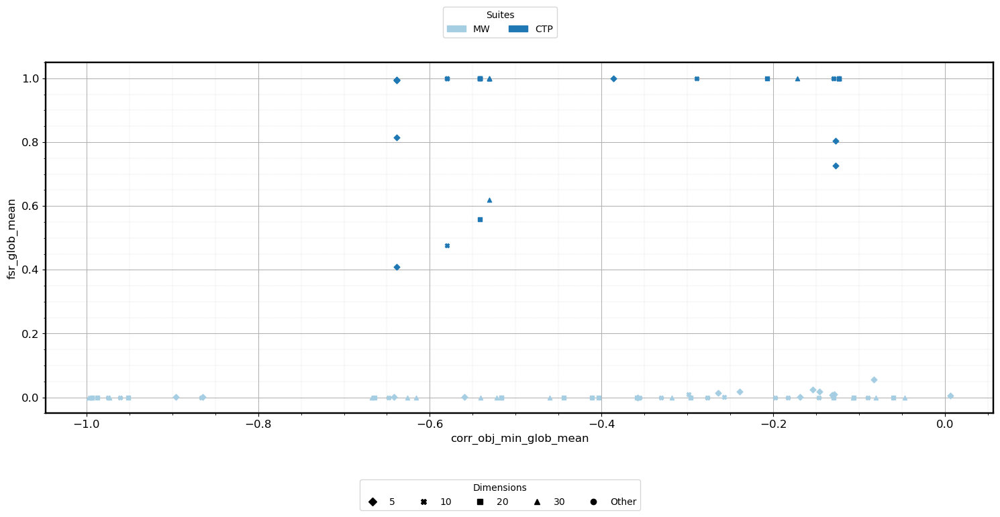

In [101]:
# Showing specific suites (excluding aerofoils)
dashboard.plot_features_comparison(
    "corr_obj_min_glob", "fsr_glob", suite_names=["MW", "CTP"], ignore_aerofoils=False
)

## Plot all features across the $n$ runs for a specific problem.


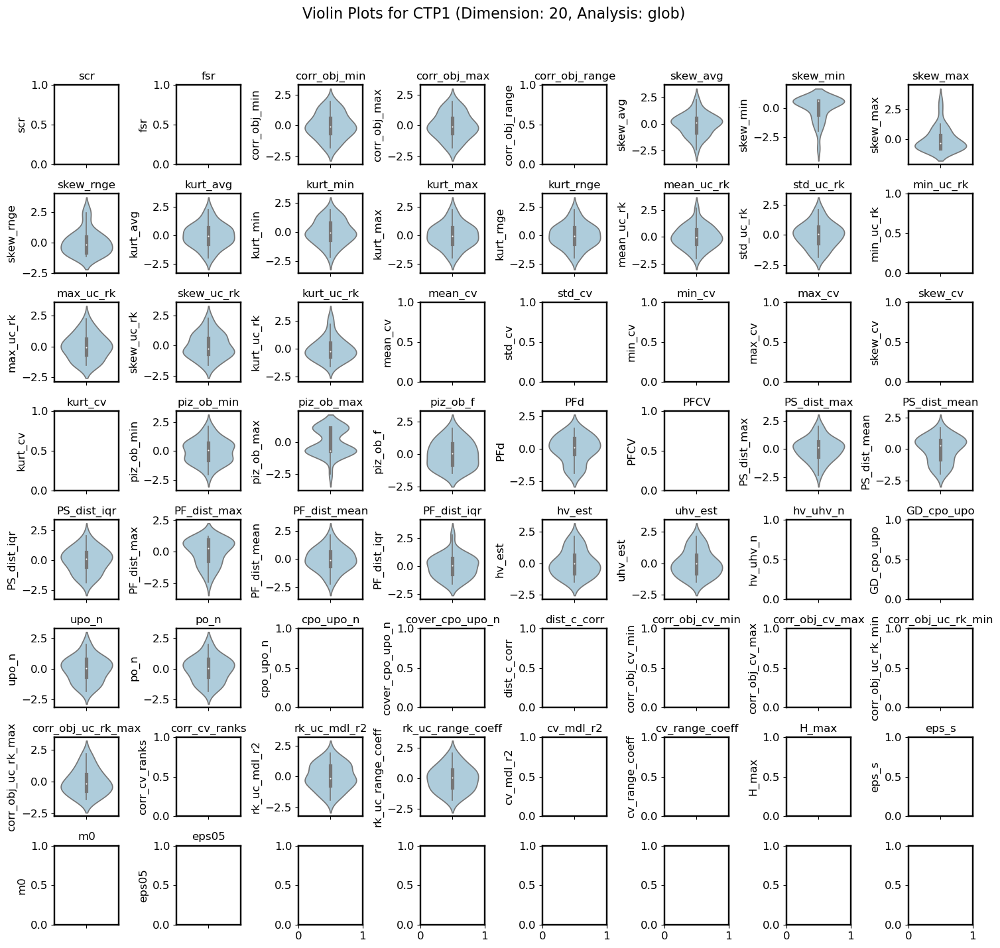

In [102]:
dashboard.plot_problem_features("CTP1", 20, "glob")

# Correlation Analysis

This code relates to the removal of redundant (highly-correlated) features in report section 4.1.3


Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7


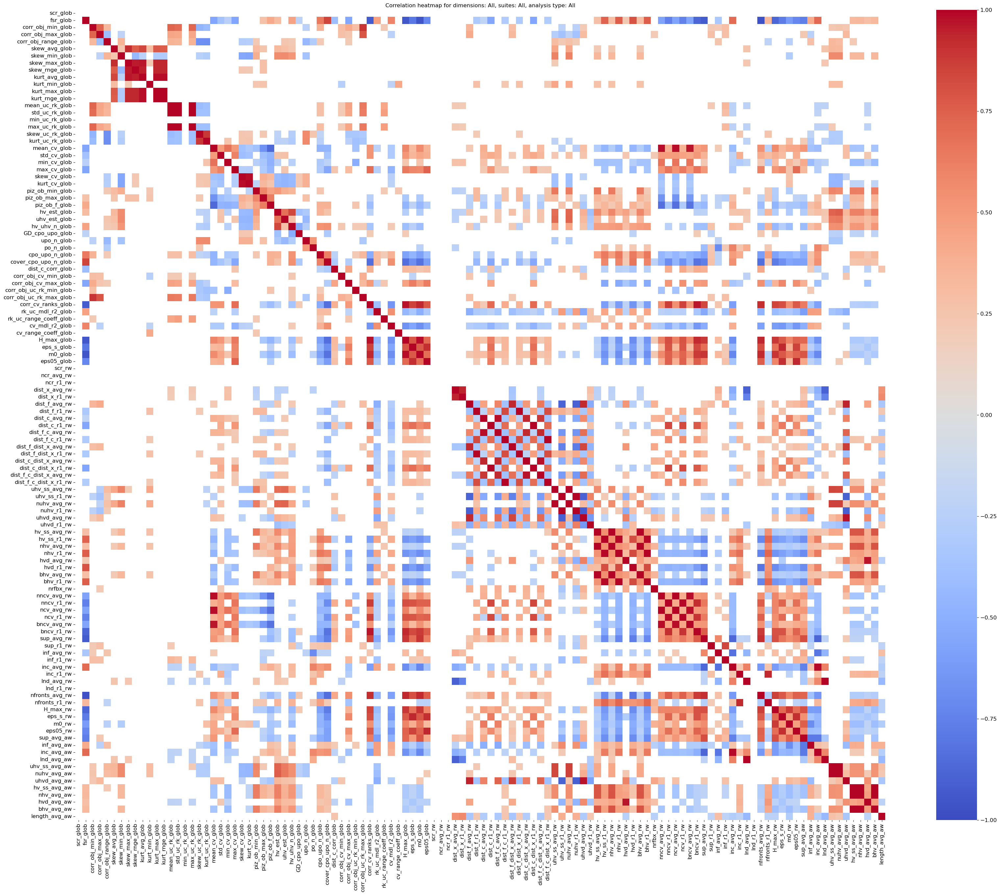

In [103]:
# This plot is hard to read.
dashboard.plot_correlation_heatmap(ignore_features=True, min_corr_magnitude=0.2)

In [104]:
corr_pairs_df = dashboard.get_top_correlation_pairs(
    min_corr_magnitude=0.98, ignore_features=True, filtered_err_pct=25
)
corr_pairs_df

Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 56
Total number of dropped instances: 4
Dropped instances:
['CTP2_d5']
Initial length of the dataframe: 32
Total number of dropped instances: 1
Dropped instances:
['CF2_d20']
Initial length of the dataframe: 15
Total number of dropped instances: 1
Dropped instances:
[]
Initial length of the dataframe: 36
Total number of dropped instances: 0
Dropped instances:
[]
Initial length of the dataframe: 56
Total number of dropped instances: 0
Dropped instances:
['RWMOP20_d4']
Initial length of the dataframe: 50
Total number of dropped instances: 1
Dropped instances:
[]
Initial length of the dataframe: 24
Total number of dropped instances: 0
Dropped instances:
[]
Initial l

,Variable 1,Variable 2,Overall,MW,CTP,CF,DASCMOP,LIRCMOP,RWMOP,DCDTLZ,CDTLZ,MODAct
0,nhv_r1_rw,bhv_r1_rw,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,nhv_avg_rw,bhv_avg_rw,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3,nncv_avg_rw,ncv_avg_rw,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.999995,1.000000,1.000000
4,kurt_max_glob,kurt_rnge_glob,0.999993,0.996879,1.000000,0.803577,0.839068,0.862757,0.999998,0.979460,0.999580,1.000000
5,dist_c_r1_rw,dist_c_dist_x_r1_rw,0.999897,0.999849,1.000000,0.999997,0.999798,0.999952,0.999692,0.999911,0.999948,0.999388
6,nhv_avg_aw,bhv_avg_aw,0.999255,1.000000,1.000000,1.000000,0.996245,1.000000,1.000000,0.999773,0.999994,0.999997
7,hv_ss_avg_aw,nhv_avg_aw,0.999161,0.999985,0.999724,0.994203,0.999788,0.999891,0.999972,0.999773,0.998784,0.999881
8,hv_ss_avg_aw,bhv_avg_aw,0.998326,0.999985,0.999723,0.994222,0.994651,0.999890,0.999971,0.999534,0.998693,0.999846
9,dist_f_c_r1_rw,dist_f_c_dist_x_r1_rw,0.997872,0.996968,0.999629,0.999610,0.999842,0.994671,0.986778,0.999533,0.999613,0.990464
10,hv_ss_avg_rw,nhv_avg_rw,0.997845,0.999993,0.999843,0.991573,0.999121,0.999872,0.999952,0.998546,0.992986,0.999536


In [105]:
# This table was used to generate Table 4 on page 52. I just picked the 'least-intuitive' feature out of each column.

# Preserve the first two columns and select only numeric columns from the rest
numeric_df = corr_pairs_df.iloc[:, 2:].select_dtypes(include=[np.number])


# Combine the first two columns with the row minima
result_df = corr_pairs_df[["Variable 1", "Variable 2"]].copy()
result_df["MinCorr"] = round(numeric_df.min(axis=1), 3)
result_df["MaxCorr"] = round(numeric_df.max(axis=1), 3)
result_df["Overall"] = round(numeric_df["Overall"], 3)


result_df[["Variable 1", "Variable 2", "Overall", "MinCorr", "MaxCorr"]]

,Variable 1,Variable 2,Overall,MinCorr,MaxCorr
0,nhv_r1_rw,bhv_r1_rw,1.000,1.000,1.000
1,nhv_avg_rw,bhv_avg_rw,1.000,1.000,1.000
3,nncv_avg_rw,ncv_avg_rw,1.000,1.000,1.000
4,kurt_max_glob,kurt_rnge_glob,1.000,0.804,1.000
5,dist_c_r1_rw,dist_c_dist_x_r1_rw,1.000,0.999,1.000
6,nhv_avg_aw,bhv_avg_aw,0.999,0.996,1.000
7,hv_ss_avg_aw,nhv_avg_aw,0.999,0.994,1.000
8,hv_ss_avg_aw,bhv_avg_aw,0.998,0.994,1.000
9,dist_f_c_r1_rw,dist_f_c_dist_x_r1_rw,0.998,0.987,1.000
10,hv_ss_avg_rw,nhv_avg_rw,0.998,0.992,1.000


Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 56
Total number of dropped instances: 4
Dropped instances:
['CTP2_d5']
Initial length of the dataframe: 32
Total number of dropped instances: 1
Dropped instances:
['CF2_d20']
Initial length of the dataframe: 15
Total number of dropped instances: 1
Dropped instances:
[]
Initial length of the dataframe: 36
Total number of dropped instances: 0
Dropped instances:
[]
Initial length of the dataframe: 56
Total number of dropped instances: 0
Dropped instances:
['RWMOP20_d4']
Initial length of the dataframe: 50
Total number of dropped instances: 1
Dropped instances:
[]
Initial length of the dataframe: 24
Total number of dropped instances: 0
Dropped instances:
[]
Initial l

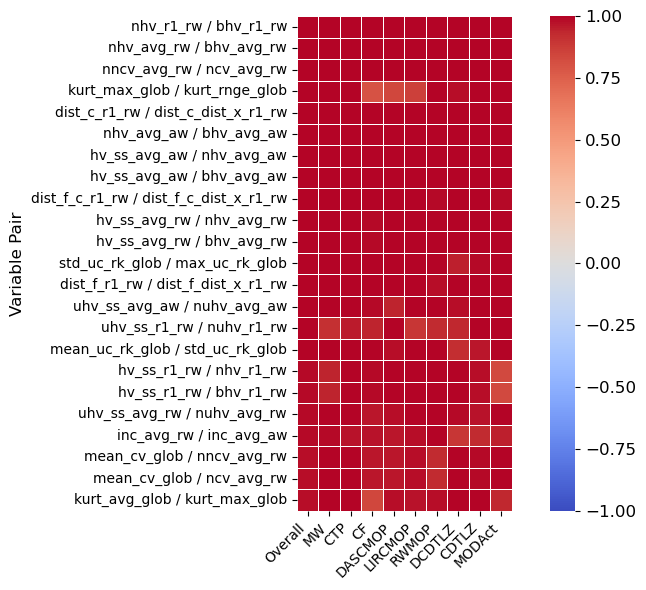

In [106]:
# Heatmap of corr_pairs_df
dashboard.plot_top_correlation_heatmap(min_corr_magnitude=0.95, filtered_err_pct=25)

Will use this analysis to remove features that are highly-correlated to maintain most orthogonal information


In [107]:
redundant_features = [
    "nncv_avg_rw",
    "ncv_avg_rw",
    "bhv_avg_rw",
    "nhv_avg_rw",
    "bhv_r1_rw",
    "nhv_r1_rw",
    "nuhv_avg_rw",
    "dist_c_dist_x_r1_rw",
    "dist_f_c_dist_x_r1_rw",
    "bhv_avg_aw",
    "nhv_avg_aw",
    "nuhv_avg_aw",
    "inc_avg_aw",
    "kurt_max_glob",
    "kurt_rnge_glob",
    "std_uc_rk_glob",
    "lnd_r1_rw",
    "min_uc_rk_glob",
]
redundant_features = [r + "_mean" for r in redundant_features]
dashboard.append_to_features_to_ignore(redundant_features)
dashboard.features_to_ignore

['PFd_glob_mean',
 'PFCV_glob_mean',
 'PS_dist_max_glob_mean',
 'PS_dist_mean_glob_mean',
 'PS_dist_iqr_glob_mean',
 'PF_dist_max_glob_mean',
 'PF_dist_mean_glob_mean',
 'PF_dist_iqr_glob_mean',
 'nncv_avg_rw_mean',
 'ncv_avg_rw_mean',
 'bhv_avg_rw_mean',
 'nhv_avg_rw_mean',
 'bhv_r1_rw_mean',
 'nhv_r1_rw_mean',
 'nuhv_avg_rw_mean',
 'dist_c_dist_x_r1_rw_mean',
 'dist_f_c_dist_x_r1_rw_mean',
 'bhv_avg_aw_mean',
 'nhv_avg_aw_mean',
 'nuhv_avg_aw_mean',
 'inc_avg_aw_mean',
 'kurt_max_glob_mean',
 'kurt_rnge_glob_mean',
 'std_uc_rk_glob_mean',
 'lnd_r1_rw_mean',
 'min_uc_rk_glob_mean']

# PCA

This was not included in the final report as it did not affect feature rankings much. See the plot of the feature importances to see why.


Dropped instances:
['XA2_d15', 'XA3_d10', 'XA4_d10', 'XA5_d10', 'XA6_d10', 'XA7_d10', 'XA8_d10', 'XA3_d20', 'XA4_d20', 'XA5_d20', 'XA7_d20', 'XA8_d20', 'XA3_d30', 'XA4_d30', 'XA5_d30', 'XA6_d30', 'XA7_d30', 'XA8_d30', 'XA6_d20', 'XA2_d25', 'XA2_d35', 'MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 326
Total number of dropped instances: 28


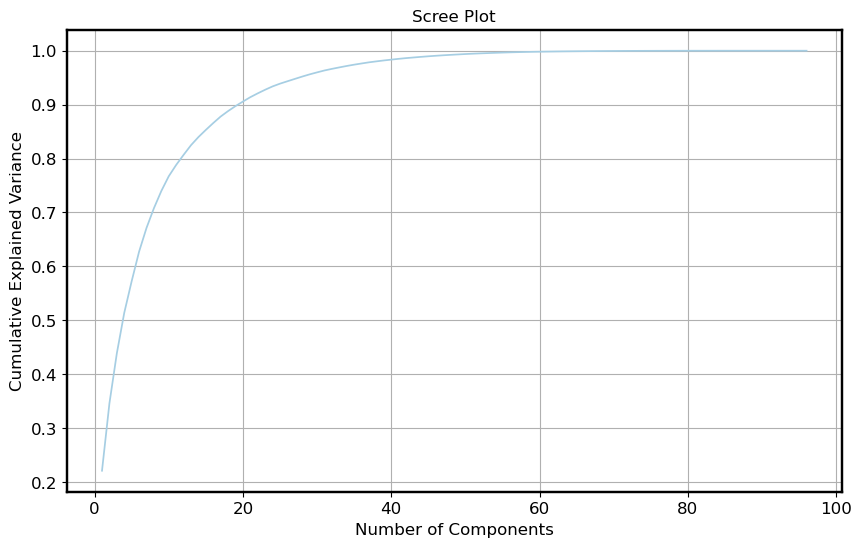

In [108]:
pca = dashboard.run_pca()
dashboard.plot_scree_plot(pca)

Note that as most of the features have very similar loadings, adding PCA as a third feature scoring method did not change the feature ranks very much.


Dropped instances:
['XA2_d15', 'XA3_d10', 'XA4_d10', 'XA5_d10', 'XA6_d10', 'XA7_d10', 'XA8_d10', 'XA3_d20', 'XA4_d20', 'XA5_d20', 'XA7_d20', 'XA8_d20', 'XA3_d30', 'XA4_d30', 'XA5_d30', 'XA6_d30', 'XA7_d30', 'XA8_d30', 'XA6_d20', 'XA2_d25', 'XA2_d35', 'MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 326
Total number of dropped instances: 28
Using 11 components explains 78.81% of the variance.
There are 96 features that have been kept in the PCA.
Dropped instances:
['XA2_d15', 'XA3_d10', 'XA4_d10', 'XA5_d10', 'XA6_d10', 'XA7_d10', 'XA8_d10', 'XA3_d20', 'XA4_d20', 'XA5_d20', 'XA7_d20', 'XA8_d20', 'XA3_d30', 'XA4_d30', 'XA5_d30', 'XA6_d30', 'XA7_d30', 'XA8_d30', 'XA6_d20', 'XA2_d25', 'XA2_d35', 'MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 326
Total number of dropped instances: 28
Using 11 components explains 78.81% of the variance.
There are 96 features 

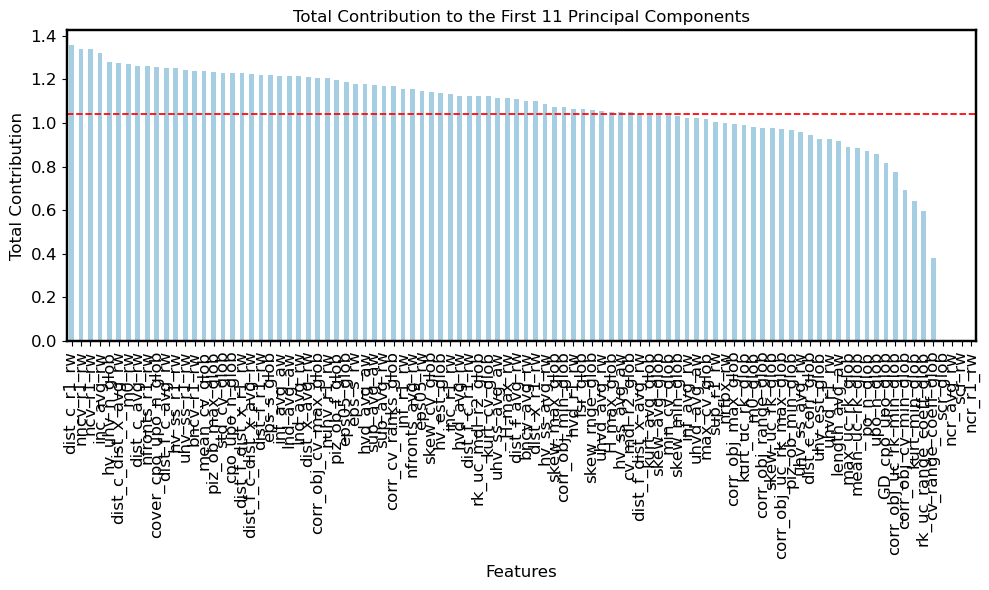

In [109]:
dashboard.plot_total_contribution(
    pca=pca, n_components=11, top_features=None, analysis_type=None
)

# High-Dimensional Visualisation

This corresponds to section 4.2 of the report.


## Hyperparameter selection (Appendix C.3)

Default hyperparameters for tSNE and UMAP were selected using silhouette score as the performance metric.


In [110]:
run_hyperparam_selection = False

if run_hyperparam_selection:
    # Finding optimal hyperparameter values using silhouette score.
    min_dists = [0.05, 0.2, 0.5, 0.8]
    sil_list = []

    for d in min_dists:
        silhouette_results = dashboard.grid_search_low_dim_hyperparameter(
            method="umap", umap_min_dist=d
        )
        sil_list.append(silhouette_results)
        
    # Run hyperparameter selection to get best trustworthiness score.
    tsne_silhouette_results = dashboard.grid_search_low_dim_hyperparameter(method="tsne")
    
    # Then append t-SNE results.
    sil_list.append(tsne_silhouette_results)
    
    # Figure 36 in report.
    dashboard.plot_dimreduction_perf_score(
        perf_results_list=sil_list,
        filepath="Results/SilhouetteScores_HyperparamSelection",
    )

## UMAP


Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.


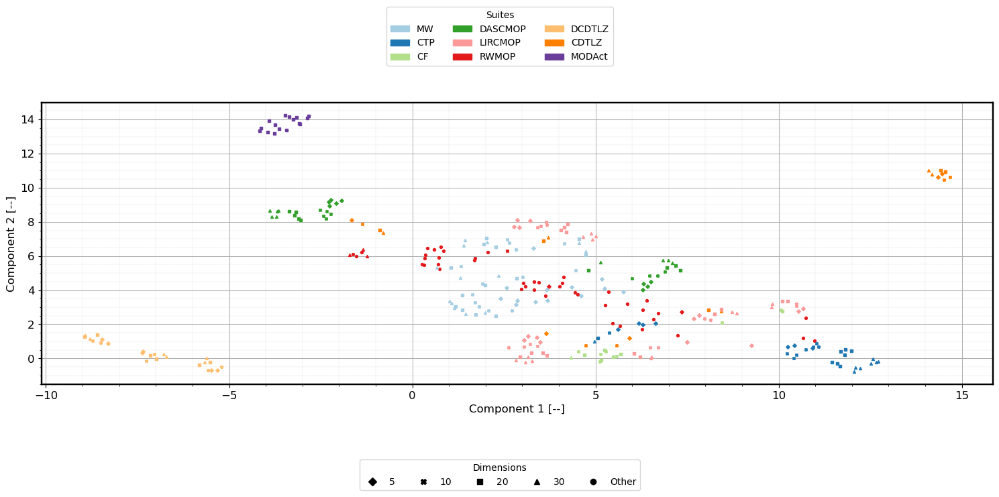

In [111]:
# Figure 16 in report.
dashboard.plot_UMAP(n_neighbors=[10], filepath="Results/UMAPOverall", random_state=45)

## $t$-SNE


Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.


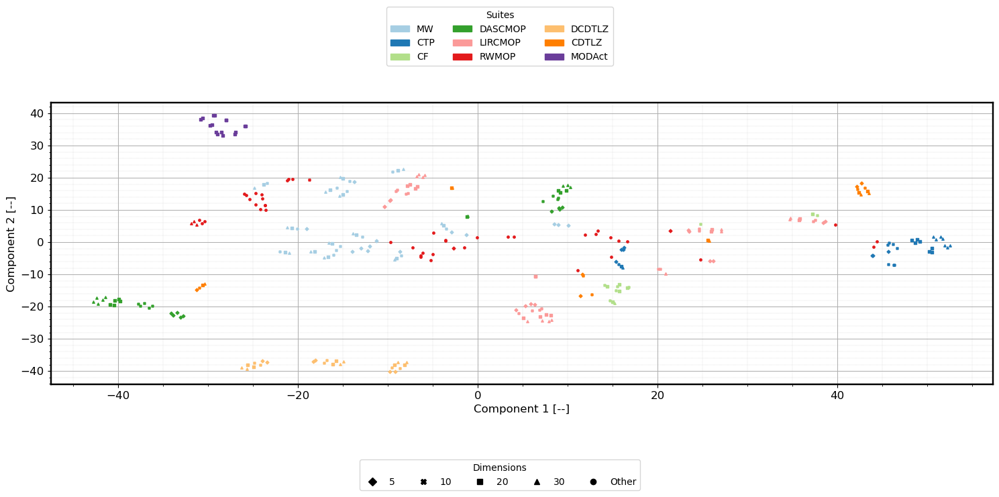

In [112]:
# Figure 17 in report.
dashboard.plot_tSNE(
    analysis_type=None,
    use_analytical_problems=False,
    random_state=100,
    filepath="Results/tSNEOverall",
)

# Feature Extraction Process (section 4.3 of report)

We combined scores from random forest classification models (use landscape features to distinguish suites) and coverage. First we show how the individual methods are run, then we update.


## Random Forest Classification Model

Classifies suite from the feature set. Need to run over multiple runs to get more robust feature importances.


In [113]:
rfs = []
reports = []
accs = []


for n in range(100):

    rf, report, acc = dashboard.train_random_forest(
        test_size=0.2,
        suite_in_focus=None,
        random_seed=n,
        return_report=True,
    )
    rfs.append(rf)
    accs.append(acc)
    reports.append(report)

Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.
This RF model training has considered 92 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      1.00      1.00         4
          CF       1.00      1.00      1.00         1
         CTP       1.00      1.00      1.00         4
     DASCMOP       1.00      1.00      1.00        11
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        16
      MODAct       1.00      1.00      1.00         2
          MW       0.80      1.00      0.89         4
       RWMOP       1.00      0.92      0.96        13

    accuracy                           0.98        60
   macro avg       0.98      0.99      0.98        60
weighted a

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c

Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.75      0.75      0.75         4
          CF       1.00      0.50      0.67         2
         CTP       1.00      1.00      1.00         7
     DASCMOP       1.00      1.00      1.00         4
      DCDTLZ       1.00      1.00      1.00         8
     LIRCMOP       0.91      1.00      0.95        10
      MODAct       1.00      1.00      1.00         6
          MW       0.86      1.00      0.92         6
       RWMOP       0.92      0.85      0.88        13

    accuracy                           0.93        60
   macro avg       0.94      0.90      0.91        60
weighted avg       0.94      0.93      0.93        60

Accuracy Score: 0.9333333333333333
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dat

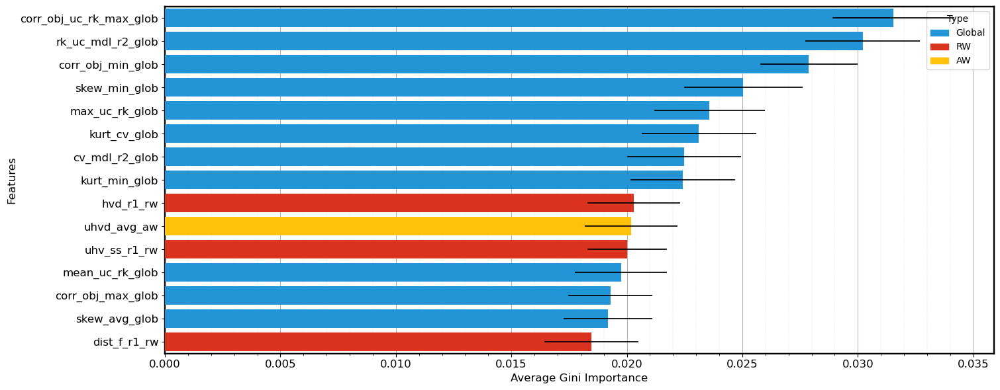

In [114]:
feature_imps = dashboard.get_feature_importances(classifiers=rfs, top_features=15)

# Figure 18 in report.
dashboard.plot_feature_importances(
    feature_importances_df=feature_imps, filepath="Results/RFFeatureImportance_Overall"
)

In [115]:
feature_imps

,Importance,SD
corr_obj_uc_rk_max_glob,0.031543,0.005268
rk_uc_mdl_r2_glob,0.030212,0.004960
corr_obj_min_glob,0.027876,0.004207
skew_min_glob,0.025041,0.005127
max_uc_rk_glob,0.023578,0.004782
kurt_cv_glob,0.023113,0.004960
cv_mdl_r2_glob,0.022470,0.004929
kurt_min_glob,0.022414,0.004523
hvd_r1_rw,0.020299,0.004000
uhvd_avg_aw,0.020177,0.004008


In [116]:
# Table 11 in report.
feature_imps = dashboard.get_feature_importances(classifiers=rfs, top_features=None)


dashboard.convert_to_latex(feature_imps, filename="OverallGiniImportances")

In [117]:
# Model performance metrics. Feeds into Table 10 in report.
dashboard.aggregate_reports(reports)

,precision,recall,f1-score,support,value
Suite,,,,,
CDTLZ,0.940 (0.154),0.874 (0.204),0.888 (0.167),3.939 (1.791),NaN
CF,0.980 (0.104),0.973 (0.127),0.966 (0.120),2.899 (1.374),NaN
CTP,0.975 (0.067),1.000 (0.000),0.986 (0.038),5.870 (2.448),NaN
DASCMOP,0.960 (0.077),0.983 (0.044),0.969 (0.052),7.590 (2.510),NaN
DCDTLZ,0.991 (0.044),1.000 (0.000),0.995 (0.026),5.120 (1.862),NaN
LIRCMOP,0.962 (0.060),1.000 (0.000),0.980 (0.033),11.570 (2.523),NaN
MODAct,0.985 (0.069),1.000 (0.000),0.991 (0.043),3.378 (1.626),NaN
MW,0.944 (0.078),0.992 (0.027),0.965 (0.046),9.690 (2.734),NaN
RWMOP,0.961 (0.066),0.874 (0.111),0.910 (0.069),10.080 (2.667),NaN


## Coverage


Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.


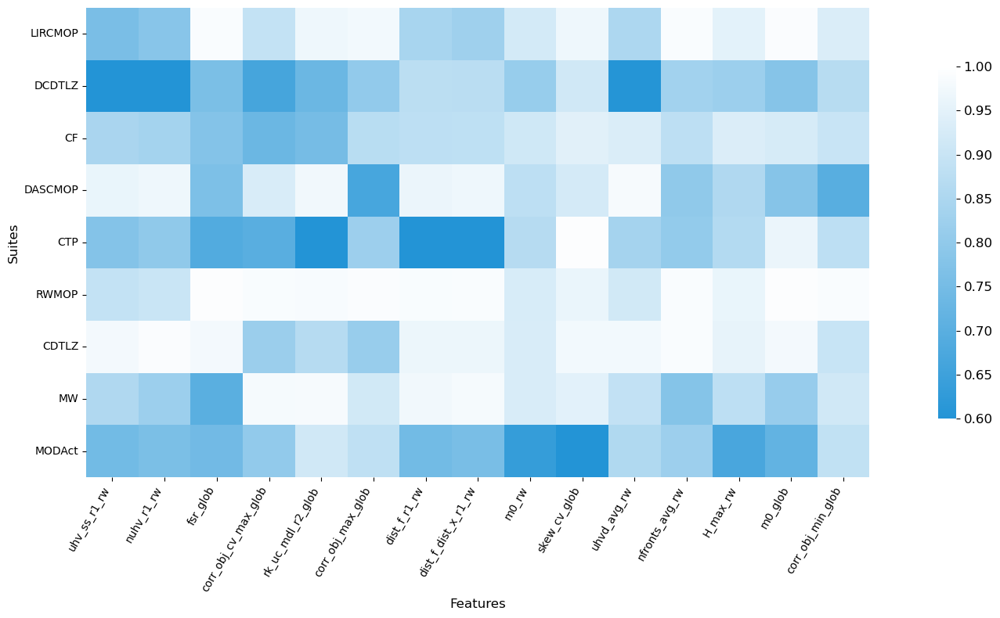

In [118]:
# Figure 19 in the report.
dashboard.plot_coverage_heatmap(
    target_suite=None, top_features=15, filepath="Results/CovFeatureImportance_Overall"
)

In [119]:
# Table 12 in report.
cov = dashboard.get_feature_coverage(target_suite=None, run_sensitivity_analysis=False)
cov = dashboard.get_top_coverage_features(coverage_values=cov, aslist=False)
cov.rename(columns={"mean_coverage": "Overall"}, inplace=True)
dashboard.convert_to_latex(
    cov, filename="OverallCoverage", include_columns=False, significant_figures=3
)

Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.


## Extracting the top features

Will now rank each of the features according to:

- Coverage
- RF Suite Classification Model Feature Importance


In [120]:
# Try running with and without PCA to see how rankings are mostly unaffected by their inclusion.
feature_ranks = dashboard.rank_each_feature(run_pca=False)

Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.
This RF model training has considered 92 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      1.00      1.00         4
          CF       1.00      1.00      1.00         1
         CTP       1.00      1.00      1.00         4
     DASCMOP       1.00      1.00      1.00        11
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        16
      MODAct   

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.75      0.75      0.75         4
          CF       1.00      0.50      0.67         2
         CTP       1.00      1.00      1.00         7
     DASCMOP       1.00      1.00      1.00         4
      DCDTLZ       1.00      1.00      1.00         8
     LIRCMOP       0.91      1.00      0.95        10
      MODAct       1.00      1.00      1.00         6
          MW       0.86      1.00      0.92         6
       RWMOP       0.92      0.85      0.88        13

    accuracy                           0.93        60
   macro avg       0.94      0.90      0.91        60
weighted avg       0.94      0.93      0.93        60

Accuracy Score: 0.9333333333333333
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dat

In [121]:
feature_ranks

,Type,Coverage,RF,CoverageMean,RFMean,MeanScore,OverallRank
rk_uc_mdl_r2_glob,Global,0.805541,0.956943,0.805541,0.956943,0.881242,1.0
uhv_ss_r1_rw,RW,1.000000,0.626991,1.000000,0.626991,0.813495,2.0
corr_obj_uc_rk_max_glob,Global,0.593640,1.000000,0.593640,1.000000,0.796820,3.0
nuhv_r1_rw,RW,0.954873,0.526328,0.954873,0.526328,0.740600,4.0
corr_obj_min_glob,Global,0.595568,0.881345,0.595568,0.881345,0.738456,5.0
...,...,...,...,...,...,...,...
lnd_avg_aw,AW,0.191323,0.047745,0.191323,0.047745,0.119534,88.0
min_cv_glob,Global,0.198613,0.038333,0.198613,0.038333,0.118473,89.0
po_n_glob,Global,0.047115,0.138883,0.047115,0.138883,0.092999,90.0
corr_obj_uc_rk_min_glob,Global,0.113018,0.000880,0.113018,0.000880,0.056949,91.0


In [122]:
if "MeanScore" in feature_ranks.columns:
    feat_ranks_cleaned = feature_ranks.rename(columns={"MeanScore": "Overall Score"})


# Table 13 in report.
dashboard.convert_to_latex(
    feat_ranks_cleaned[["RF", "Coverage", "Overall Score", "OverallRank"]],
    filename="OverallFeatureScores",
    significant_figures=3,
)

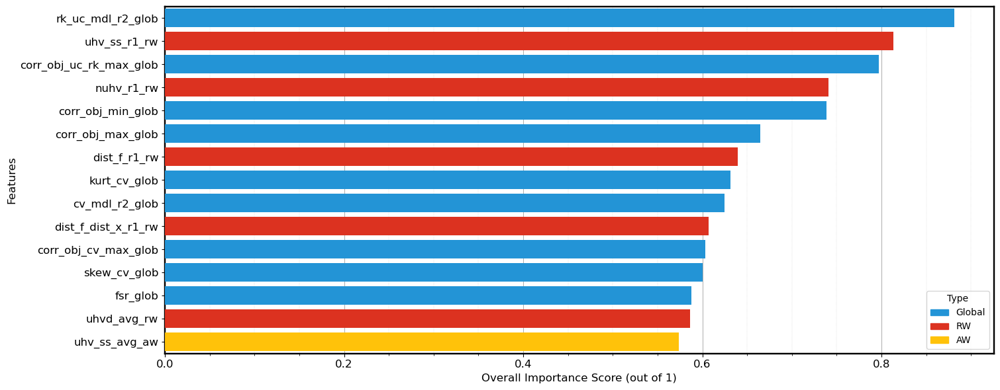

In [123]:
# Figure 20 in the report.
dashboard.plot_feature_importances(
    feature_importances_df=feat_ranks_cleaned.head(15),
    filepath="Results/FeatureScores_Overall",
    variable_name="Overall Score",
    xlabel="Overall Importance Score (out of 1)",
)

In [124]:
# # Run sensitivity analysis
# sens = dashboard.run_feature_selection_sensitivity_analysis(
#     non_noisy_feature_scores=feature_ranks,
#     run_pca=False,
#     num_samples=3,
#     noise_levels=[0.05, 0.1, 0.2, 0.5],
# )

In [125]:
# sens_cleaned = sens.rename(
#     index={"MeanScore": "Overall Score", "OverallRank": "Overall Rank"}
# )
# sens_cleaned = sens_cleaned.loc[["Coverage", "RF", "Overall Score", "Overall Rank"]]

# FeaturesDashboard.convert_to_latex(
#     sens_cleaned,
#     filename="OverallFeatureScores_Sens",
#     custom_format_index=False,
#     significant_figures=1,
# )

Investigating if ranks are correlated between importance determination methods.


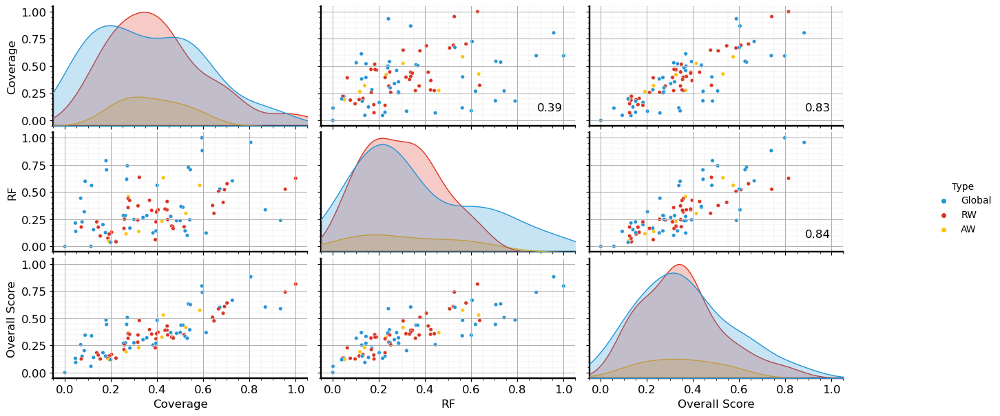

In [126]:
# Figure 21 in report.
feature_ranks.rename(
    columns={"MeanScore": "Overall Score"},
    inplace=True,
)


g = dashboard.generate_scatterplot_matrix(
    feature_ranks,
    columns=["Type", "Coverage", "RF", "Overall Score"],
    color_by="Type",
    filepath="Results/CombinedScores_Overall",
    limits=(-0.05, 1.05),
)

In [127]:
# Extract top n features in terms of mean rank.
n_features = 15
top_features = feature_ranks.head(n_features)
top_features

,Type,Coverage,RF,CoverageMean,RFMean,Overall Score,OverallRank
rk_uc_mdl_r2_glob,Global,0.805541,0.956943,0.805541,0.956943,0.881242,1.0
uhv_ss_r1_rw,RW,1.000000,0.626991,1.000000,0.626991,0.813495,2.0
corr_obj_uc_rk_max_glob,Global,0.593640,1.000000,0.593640,1.000000,0.796820,3.0
nuhv_r1_rw,RW,0.954873,0.526328,0.954873,0.526328,0.740600,4.0
corr_obj_min_glob,Global,0.595568,0.881345,0.595568,0.881345,0.738456,5.0
corr_obj_max_glob,Global,0.725603,0.603607,0.725603,0.603607,0.664605,6.0
dist_f_r1_rw,RW,0.702635,0.576995,0.702635,0.576995,0.639815,7.0
kurt_cv_glob,Global,0.535334,0.727236,0.535334,0.727236,0.631285,8.0
cv_mdl_r2_glob,Global,0.543712,0.706440,0.543712,0.706440,0.625076,9.0
dist_f_dist_x_r1_rw,RW,0.691570,0.522662,0.691570,0.522662,0.607116,10.0


In [128]:
# Create new features dashboard with reduced feature set.
top_features_list = top_features.index.to_list()

dash_reduced = copy.deepcopy(dashboard)
dash_reduced.use_these_features_only(top_features_list)

All specified features have been considered


Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20']
Initial length of the dataframe: 305
Total number of dropped instances: 5
This dataframe contains 15 features.


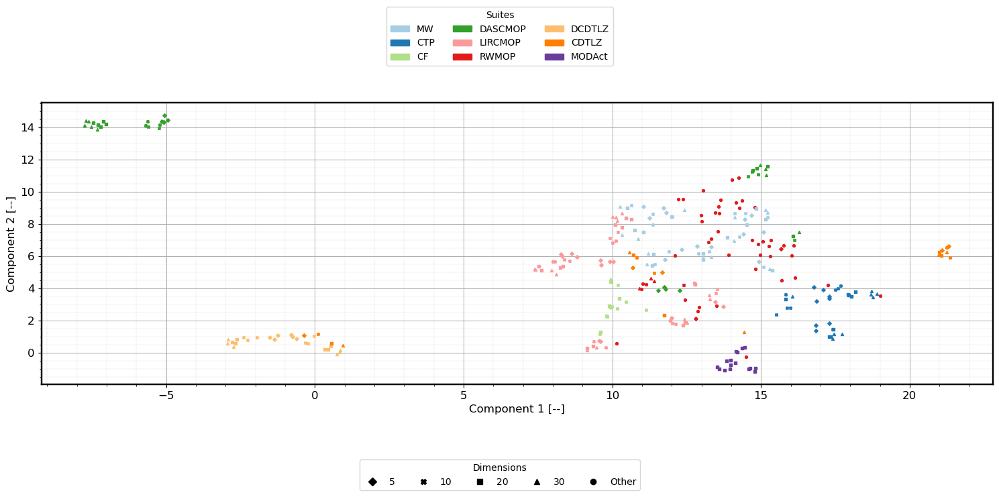

In [129]:
# Figure 22 in the report.
dash_reduced.generate_suite_colors()
dash_reduced.plot_UMAP(filepath="Results/UMAPOverall_Reduced", random_state=15)

Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20']
Initial length of the dataframe: 305
Total number of dropped instances: 5
This dataframe contains 15 features.


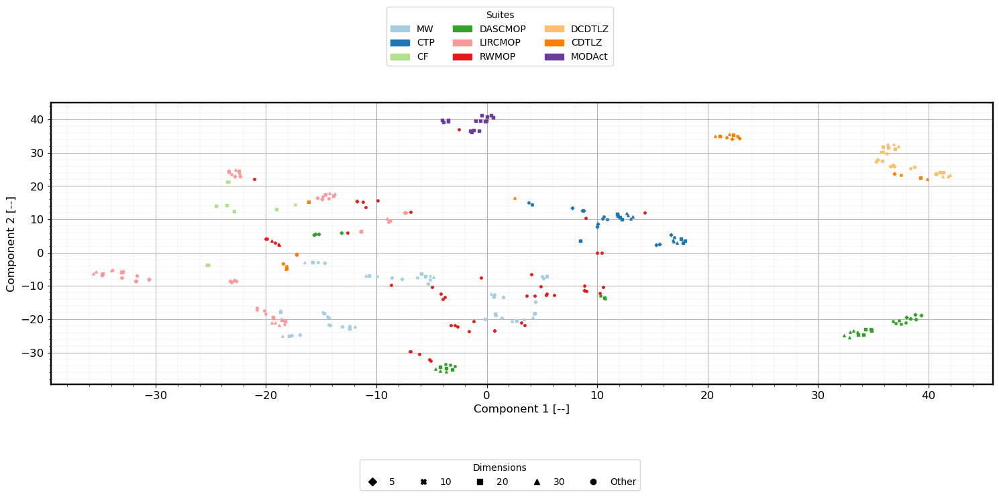

In [130]:
# Figure 40 in report.
dash_reduced.plot_tSNE(filepath="Results/tSNEOverall_Reduced", random_state=25)

## Investigating whether top features are independent of dimension.

This is not documented super well as I did not include it in the report.


In [131]:
# # Initialise dataframe.
# ranks_across_dims = pd.DataFrame(
#     index=dashboard.get_feature_names(ignore_features=True)
# )


# # Make a new dashboard each time and update the dataframe.


# dims = [
#     None,
#     [i for i in np.arange(1, 10 + 1)],
#     [i for i in np.arange(11, 20 + 1)],
#     [i for i in np.arange(21, 30 + 1)],
# ]


# for ctr, d in enumerate(dims):

#     if ctr == 0:

#         dim_str = "All"

#     elif ctr == 1:

#         dim_str = "1-10"

#     elif ctr == 2:

#         dim_str = "11-20"

#     elif ctr == 3:

#         dim_str = "21-30"

#     dash_d = copy.deepcopy(dashboard)

#     print(f"---------- Running for {dim_str} ----------")

#     if d is not None:

#         dash_d.set_dashboard_dimensionality(d=d)

#     feature_ranks = dash_d.rank_each_feature()

#     ranks_across_dims[f"MeanScore{dim_str}D"] = feature_ranks["MeanScore"]

#     ranks_across_dims[f"Rank{dim_str}D"] = feature_ranks["OverallRank"]

In [132]:
# ranks_across_dims["Type"] = feature_ranks.index.to_series().apply(
#     lambda x: (
#         "Global"
#         if "_glob" in x
#         else ("RW" if "_rw" in x else ("AW" if "_aw" in x else "Other"))
#     )
# )
# ranks_across_dims

In [133]:
# # Mean rank plot
# mean_rank_cols = [c for c in ranks_across_dims.columns if "MeanScore" not in c]

# g = dashboard.generate_scatterplot_matrix(
#     ranks_across_dims, columns=mean_rank_cols, color_by="Type"
# )
# # for ax in g.axes.flatten():
# #     if ax:
# #         ax.set_xlim(0, len(ranks_across_dims))
# #         ax.set_ylim(0, len(ranks_across_dims))

In [134]:
# # Rank of rank plot
# rank_rank_cols = [c for c in ranks_across_dims.columns if "Rank" not in c]

# g = dashboard.generate_scatterplot_matrix(
#     ranks_across_dims, columns=rank_rank_cols, color_by="Type"
# )
# # for ax in g.axes.flatten():
# #     if ax:
# #         ax.set_xlim(0, len(ranks_across_dims))
# #         ax.set_ylim(0, len(ranks_across_dims))

# Global Only Analysis (Section 4.5 of report)

This also feeds into the impact of dimension reduction method.


In [135]:
# Consider global features only.
global_dashboard = copy.deepcopy(dashboard)
global_dashboard.set_dashboard_analysis_type("glob")

### Coverage (for Appendix D.6)


Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 45 features.


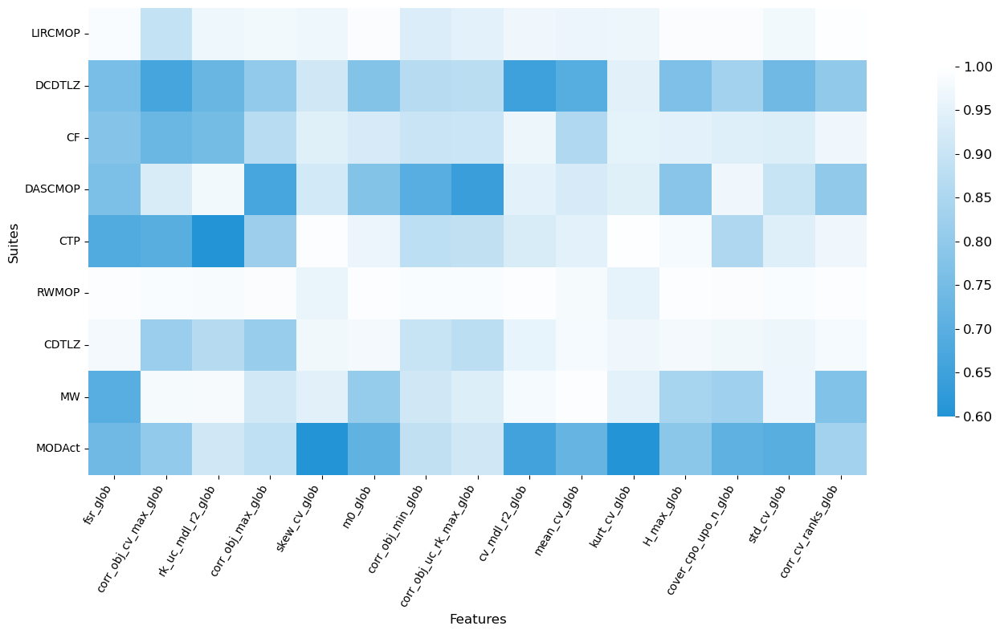

In [136]:
# Figure 43 in report.
global_dashboard.plot_coverage_heatmap(
    target_suite=None,
    top_features=15,
    filepath="Results/CovFeatureImportance_Global",
)

### Gini importance

Here we outline how a few tables (Appendix D.3.2) and figures (for Appendix D.6) were generated.


In [137]:
rfs = []
reports = []
accs = []


for n in range(100):

    rf, report, acc = global_dashboard.train_random_forest(
        test_size=0.2,
        suite_in_focus=None,
        random_seed=n,
        scaler_type="MinMaxScaler",
        return_report=True,
    )
    rfs.append(rf)
    accs.append(acc)
    reports.append(report)

Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 45 features.
This RF model training has considered 45 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.75      0.86         4
          CF       1.00      1.00      1.00         2
         CTP       0.88      1.00      0.93         7
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        12
      MODAct       1.00      1.00      1.00         3
          MW       0.86      1.00      0.92         6
       RWMOP       1.00      0.92      0.96        12

    accuracy                           0.97        60
   macro avg       0.97      0.96      0.96        60
weighted avg       0

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\

Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.80      1.00      0.89         4
          CF       1.00      1.00      1.00         2
         CTP       1.00      1.00      1.00         3
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         9
     LIRCMOP       1.00      1.00      1.00        12
      MODAct       1.00      1.00      1.00         3
          MW       1.00      0.89      0.94         9
       RWMOP       1.00      1.00      1.00         9

    accuracy                           0.98        60
   macro avg       0.98      0.99      0.98        60
weighted avg       0.99      0.98      0.98        60

Accuracy Score: 0.9833333333333333
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe con

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\

Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.86      1.00      0.92         6
          CF       1.00      1.00      1.00         2
         CTP       1.00      1.00      1.00         6
     DASCMOP       0.78      1.00      0.88         7
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       0.91      1.00      0.95        10
      MODAct       1.00      1.00      1.00         2
          MW       0.90      0.90      0.90        10
       RWMOP       1.00      0.67      0.80        12

    accuracy                           0.92        60
   macro avg       0.94      0.95      0.94        60
weighted avg       0.93      0.92      0.91        60

Accuracy Score: 0.9166666666666666
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe con

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c

Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.57      0.80      0.67         5
          CF       1.00      1.00      1.00         1
         CTP       1.00      1.00      1.00         6
     DASCMOP       1.00      0.86      0.92         7
      DCDTLZ       1.00      1.00      1.00         7
     LIRCMOP       1.00      1.00      1.00        14
      MODAct       1.00      1.00      1.00         1
          MW       0.90      0.75      0.82        12
       RWMOP       0.75      0.86      0.80         7

    accuracy                           0.90        60
   macro avg       0.91      0.92      0.91        60
weighted avg       0.92      0.90      0.90        60

Accuracy Score: 0.9
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 45 featur

In [138]:
glob_feature_imps = global_dashboard.get_feature_importances(
    classifiers=rfs, top_features=None
)

# Table 14 in report.
dashboard.convert_to_latex(glob_feature_imps, filename="GlobalGiniImportances")

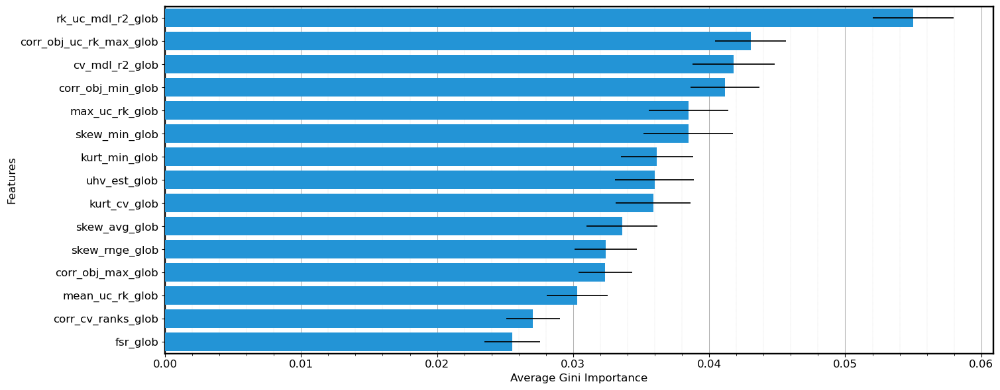

In [139]:
# Figure 42 in report.
glob_feature_imps = global_dashboard.get_feature_importances(
    classifiers=rfs, top_features=15
)


global_dashboard.plot_feature_importances(
    feature_importances_df=glob_feature_imps,

    filepath="Results/RFFeatureImportance_Global",
    show_legend=False,
)

Aerofoils are being considered for this global only feature set.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 326
Total number of dropped instances: 6
This dataframe contains 45 features.


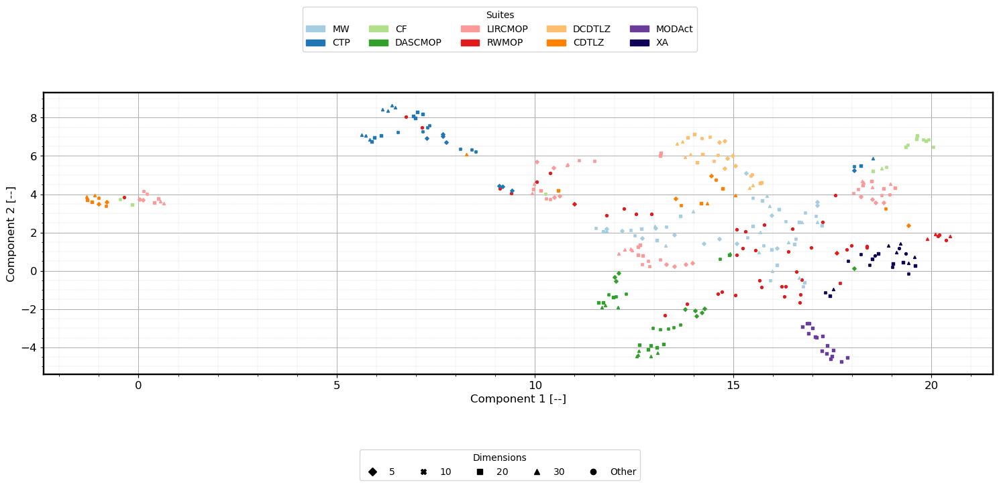

Aerofoils are being considered for this global only feature set.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 326
Total number of dropped instances: 6
This dataframe contains 45 features.


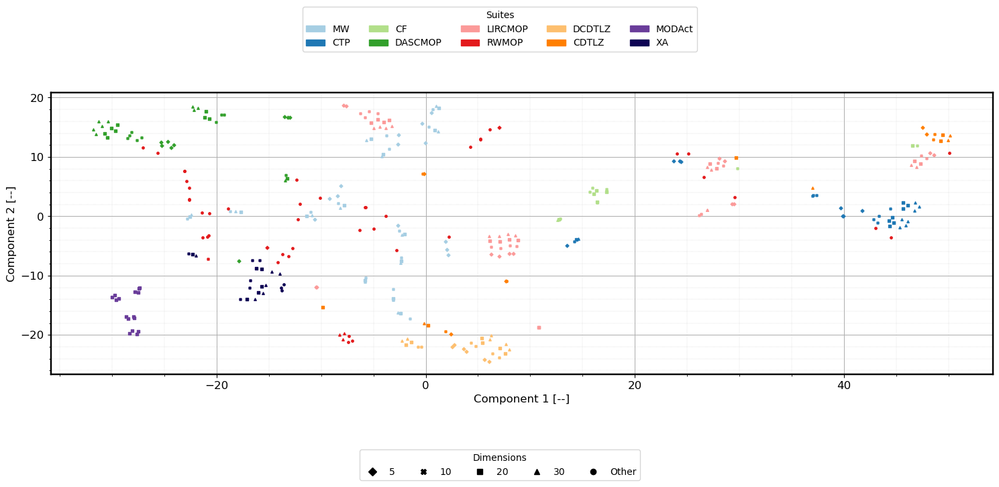

In [140]:
# The UMAP and t-SNE plots of all 45 global-only features did not make it into the report.
global_dashboard.plot_UMAP(
    ignore_aerofoils=False,
    train_with_aerofoils=True,
    filepath="Results/UMAPGlobalOnly_Aerofoils",
    random_state=30,
)

global_dashboard.plot_tSNE(
    ignore_aerofoils=False,
    filepath="Results/tSNEGlobalOnly_Aerofoils",
    perplexities=[15],
)

### Extracting top features

Now going to isolate the top global features from the set of global. We don't want to use the previous analysis since the RW/AW features may affect things.


In [141]:
global_feature_ranks = global_dashboard.rank_each_feature(drop_these_probs=None)

Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 45 features.
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 45 features.
This RF model training has considered 45 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.75      0.86         4
          CF       1.00      1.00      1.00         2
         CTP       0.88      1.00      0.93         7
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        12
      MODAct       1.00      1.00  

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.80      1.00      0.89         4
          CF       1.00      1.00      1.00         2
         CTP       1.00      1.00      1.00         3
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         9
     LIRCMOP       1.00      1.00      1.00        12
      MODAct       1.00      1.00      1.00         3
          MW       1.00      0.89      0.94         9
       RWMOP       1.00      1.00      1.00         9

    accuracy                           0.98        60
   macro avg       0.98      0.99      0.98        60
weighted avg       0.99      0.98      0.98        60

Accuracy Score: 0.9833333333333333
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe con

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.86      1.00      0.92         6
          CF       1.00      1.00      1.00         2
         CTP       1.00      1.00      1.00         6
     DASCMOP       0.78      1.00      0.88         7
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       0.91      1.00      0.95        10
      MODAct       1.00      1.00      1.00         2
          MW       0.90      0.90      0.90        10
       RWMOP       1.00      0.67      0.80        12

    accuracy                           0.92        60
   macro avg       0.94      0.95      0.94        60
weighted avg       0.93      0.92      0.91        60

Accuracy Score: 0.9166666666666666
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe con

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.57      0.80      0.67         5
          CF       1.00      1.00      1.00         1
         CTP       1.00      1.00      1.00         6
     DASCMOP       1.00      0.86      0.92         7
      DCDTLZ       1.00      1.00      1.00         7
     LIRCMOP       1.00      1.00      1.00        14
      MODAct       1.00      1.00      1.00         1
          MW       0.90      0.75      0.82        12
       RWMOP       0.75      0.86      0.80         7

    accuracy                           0.90        60
   macro avg       0.91      0.92      0.91        60
weighted avg       0.92      0.90      0.90        60

Accuracy Score: 0.9
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 45 featur

In [142]:
global_feature_ranks.head(15)

,Type,Coverage,RF,CoverageMean,RFMean,MeanScore,OverallRank
rk_uc_mdl_r2_glob,Global,0.859940,1.000000,0.859940,1.000000,0.929970,1.0
fsr_glob,Global,1.000000,0.452973,1.000000,0.452973,0.726486,2.0
corr_obj_uc_rk_max_glob,Global,0.631049,0.778248,0.631049,0.778248,0.704648,3.0
corr_obj_min_glob,Global,0.632837,0.743082,0.632837,0.743082,0.687959,4.0
corr_obj_max_glob,Global,0.772635,0.579931,0.772635,0.579931,0.676283,5.0
corr_obj_cv_max_glob,Global,0.921834,0.426005,0.921834,0.426005,0.673920,6.0
cv_mdl_r2_glob,Global,0.581283,0.755470,0.581283,0.755470,0.668376,7.0
kurt_cv_glob,Global,0.574946,0.645350,0.574946,0.645350,0.610148,8.0
skew_cv_glob,Global,0.720530,0.431035,0.720530,0.431035,0.575783,9.0
uhv_est_glob,Global,0.424906,0.647074,0.424906,0.647074,0.535990,10.0


In [143]:
# Table 17 in report.
dashboard.convert_to_latex(

    global_feature_ranks[["RF", "Coverage", "MeanScore", "OverallRank"]],
    filename="GlobalFeatureScores",
)

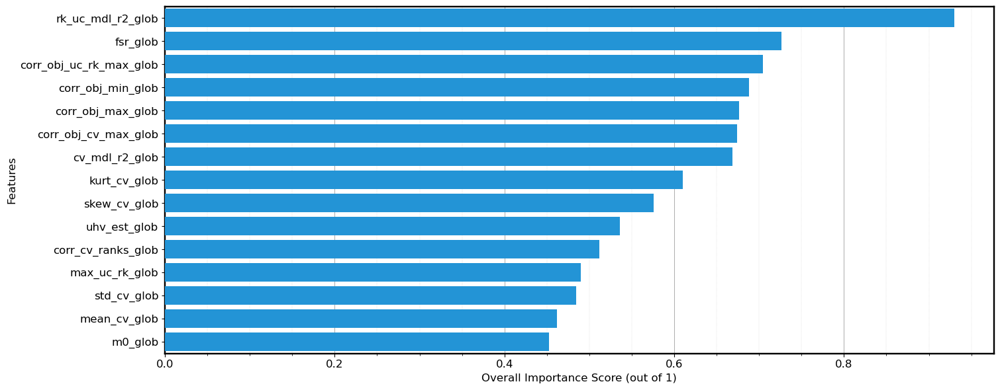

In [144]:
if "MeanScore" in global_feature_ranks.columns:
    global_feature_ranks_cleaned = global_feature_ranks.rename(
        columns={"MeanScore": "Overall Score"}
    )

# Figure 24 in report.
dashboard.plot_feature_importances(
    feature_importances_df=global_feature_ranks_cleaned.head(15),
    filepath="Results/FeatureScores_Global",
    variable_name="Overall Score",
    xlabel="Overall Importance Score (out of 1)",
    show_legend=False,
)

In [145]:
# Run sensitivity analysis
# glob_sens = global_dashboard.run_feature_selection_sensitivity_analysis(
#     non_noisy_feature_scores=global_feature_ranks,
#     run_pca=False,
#     num_samples=3,
#     noise_levels=[0.05, 0.1, 0.2, 0.5],
# )

In [146]:
# glob_sens_cleaned = glob_sens.rename(
#     index={"MeanScore": "Overall Score", "OverallRank": "Overall Rank"}
# )
# glob_sens_cleaned = glob_sens_cleaned.loc[
#     ["Coverage", "RF", "Overall Score", "Overall Rank"]
# ]

# dashboard.convert_to_latex(
#     glob_sens_cleaned,
#     filename="GlobalFeatureScores_Sens",
#     custom_format_index=False,
#     significant_figures=1,
# )

In [147]:
n_glob_features = 15
top_glob_features = global_feature_ranks.head(n_glob_features)
top_glob_features

,Type,Coverage,RF,CoverageMean,RFMean,MeanScore,OverallRank
rk_uc_mdl_r2_glob,Global,0.859940,1.000000,0.859940,1.000000,0.929970,1.0
fsr_glob,Global,1.000000,0.452973,1.000000,0.452973,0.726486,2.0
corr_obj_uc_rk_max_glob,Global,0.631049,0.778248,0.631049,0.778248,0.704648,3.0
corr_obj_min_glob,Global,0.632837,0.743082,0.632837,0.743082,0.687959,4.0
corr_obj_max_glob,Global,0.772635,0.579931,0.772635,0.579931,0.676283,5.0
corr_obj_cv_max_glob,Global,0.921834,0.426005,0.921834,0.426005,0.673920,6.0
cv_mdl_r2_glob,Global,0.581283,0.755470,0.581283,0.755470,0.668376,7.0
kurt_cv_glob,Global,0.574946,0.645350,0.574946,0.645350,0.610148,8.0
skew_cv_glob,Global,0.720530,0.431035,0.720530,0.431035,0.575783,9.0
uhv_est_glob,Global,0.424906,0.647074,0.424906,0.647074,0.535990,10.0


In [148]:
top_glob_features_list = top_glob_features.index.to_list()

glob_reduced_dash = copy.deepcopy(global_dashboard)
glob_reduced_dash.use_these_features_only(top_glob_features_list)

All specified features have been considered


Aerofoils are being considered for this global only feature set.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20']
Initial length of the dataframe: 326
Total number of dropped instances: 5
This dataframe contains 15 features.


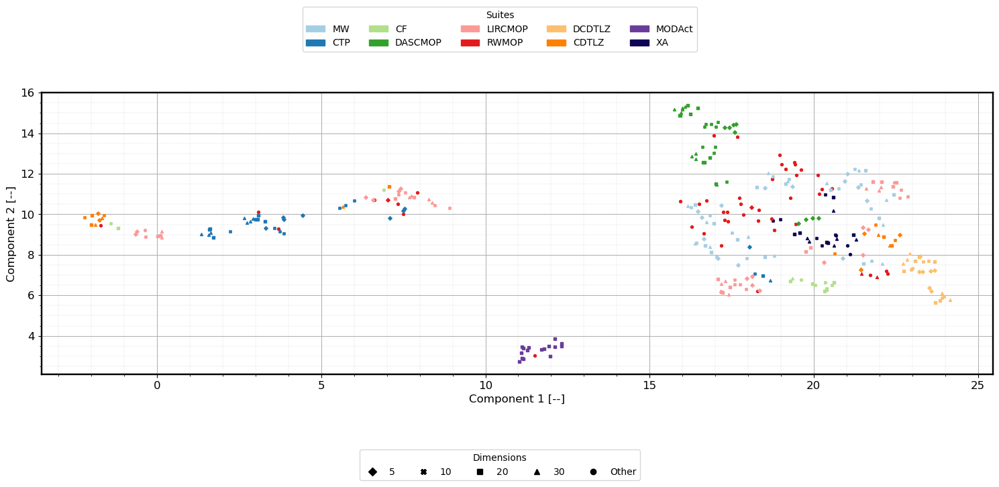

In [149]:
# Figure 25 in report.
glob_reduced_dash.plot_UMAP(
    ignore_aerofoils=False,
    train_with_aerofoils=True,
    random_state=10,
    n_neighbors=[15],

    filepath="Results/UMAPGlobal_Reduced",
)

Aerofoils are being considered for this global only feature set.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20']
Initial length of the dataframe: 326
Total number of dropped instances: 5
This dataframe contains 15 features.


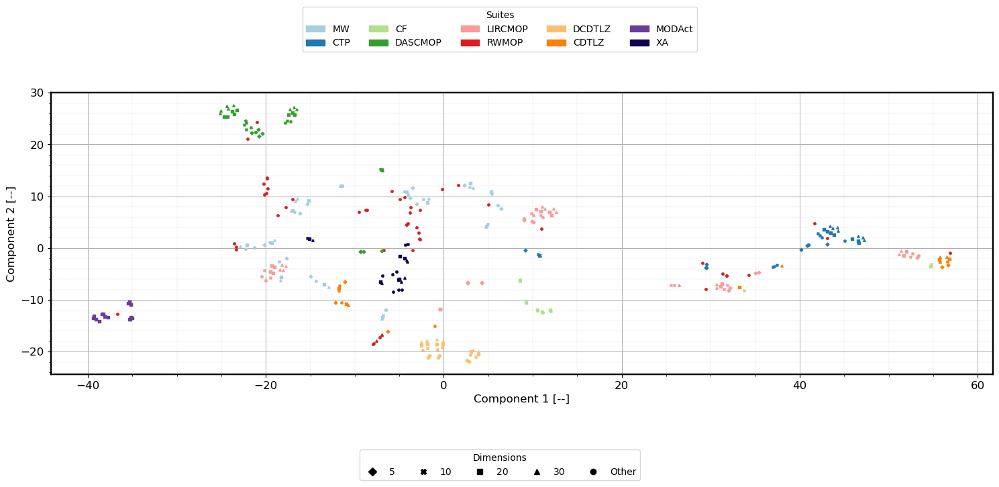

In [150]:
# Figure 41 in report.
glob_reduced_dash.plot_tSNE(
    filepath="Results/tSNEGlobal_Reduced",
    random_state=25,
    perplexities=[15],
    ignore_aerofoils=False,
)

## Random Walk Only Analysis

Steps are identical to global-only analysis. We are not interested in plotting coverage/Gini importance values though.


In [151]:
# Consider global features only.
walk_dashboard = copy.deepcopy(dashboard)
walk_dashboard.set_dashboard_analysis_type("rw")

In [152]:
top_rw_features = walk_dashboard.rank_each_feature()

Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model training has considered 39 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.75      0.86         4
          CF       0.75      1.00      0.86         3
         CTP       1.00      1.00      1.00         8
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         1
     LIRCMOP       1.00      1.00      1.00        16
      MODAct       1.00      1.00      1.00         3
          MW       0.90      1.00      0.95         9
     

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.50      0.33      0.40         3
          CF       0.50      0.67      0.57         3
         CTP       0.86      1.00      0.92         6
     DASCMOP       0.80      0.92      0.86        13
      DCDTLZ       1.00      1.00      1.00         4
     LIRCMOP       0.80      1.00      0.89         8
          MW       1.00      0.80      0.89        15
       RWMOP       1.00      0.78      0.88         9

    accuracy                           0.85        61
   macro avg       0.81      0.81      0.80        61
weighted avg       0.87      0.85      0.85        61

Accuracy Score: 0.8524590163934426
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model training has considered 39 features.
Classification Report:


c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.67      0.80         3
          CF       0.50      1.00      0.67         1
         CTP       0.88      1.00      0.93         7
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         4
     LIRCMOP       1.00      0.78      0.88         9
      MODAct       1.00      1.00      1.00         5
          MW       0.73      1.00      0.84         8
       RWMOP       1.00      0.87      0.93        15

    accuracy                           0.92        61
   macro avg       0.90      0.92      0.89        61
weighted avg       0.94      0.92      0.92        61

Accuracy Score: 0.9180327868852459
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model traini

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.40      0.57         5
          CF       1.00      1.00      1.00         3
         CTP       1.00      1.00      1.00         2
     DASCMOP       0.67      0.80      0.73         5
      DCDTLZ       1.00      1.00      1.00         3
     LIRCMOP       0.86      0.86      0.86        14
      MODAct       1.00      1.00      1.00         5
          MW       0.87      0.93      0.90        14
       RWMOP       0.73      0.80      0.76        10

    accuracy                           0.85        61
   macro avg       0.90      0.87      0.87        61
weighted avg       0.86      0.85      0.85        61

Accuracy Score: 0.8524590163934426
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model traini

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.60      0.75         5
          CF       0.75      1.00      0.86         3
         CTP       1.00      1.00      1.00         3
     DASCMOP       1.00      1.00      1.00         6
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       0.93      1.00      0.96        13
      MODAct       1.00      1.00      1.00         2
          MW       0.67      1.00      0.80         6
       RWMOP       1.00      0.83      0.91        18

    accuracy                           0.92        61
   macro avg       0.93      0.94      0.92        61
weighted avg       0.94      0.92      0.92        61

Accuracy Score: 0.9180327868852459
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model traini

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.50      0.67         6
          CF       1.00      1.00      1.00         5
         CTP       1.00      1.00      1.00         6
     DASCMOP       1.00      1.00      1.00         5
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       0.93      1.00      0.97        14
      MODAct       1.00      1.00      1.00         1
          MW       0.90      1.00      0.95         9
       RWMOP       0.82      0.90      0.86        10

    accuracy                           0.93        61
   macro avg       0.96      0.93      0.94        61
weighted avg       0.94      0.93      0.93        61

Accuracy Score: 0.9344262295081968
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model traini

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.00      0.00      0.00         2
          CF       0.83      0.83      0.83         6
         CTP       0.89      1.00      0.94         8
     DASCMOP       0.82      0.90      0.86        10
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       0.88      1.00      0.93         7
      MODAct       1.00      1.00      1.00         1
          MW       1.00      0.86      0.92        14
       RWMOP       0.75      0.75      0.75         8

    accuracy                           0.87        61
   macro avg       0.80      0.82      0.80        61
weighted avg       0.86      0.87      0.86        61

Accuracy Score: 0.8688524590163934
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 39 features.
This RF model traini

In [153]:
top_rw_features_list = top_rw_features.index.to_list()

rw_reduced_dash = copy.deepcopy(dashboard)
rw_reduced_dash.use_these_features_only(top_rw_features_list)

All specified features have been considered


In [154]:
top_rw_features

,Type,Coverage,RF,CoverageMean,RFMean,MeanScore,OverallRank
uhv_ss_r1_rw,RW,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
nuhv_r1_rw,RW,0.950551,0.848296,0.950551,0.848296,0.899424,2.0
dist_f_r1_rw,RW,0.681275,0.892794,0.681275,0.892794,0.787034,3.0
dist_f_dist_x_r1_rw,RW,0.669445,0.828488,0.669445,0.828488,0.748967,4.0
m0_rw,RW,0.663125,0.828860,0.663125,0.828860,0.745992,5.0
uhvd_avg_rw,RW,0.636110,0.854092,0.636110,0.854092,0.745101,6.0
H_max_rw,RW,0.614455,0.678241,0.614455,0.678241,0.646348,7.0
uhv_ss_avg_rw,RW,0.399335,0.865540,0.399335,0.865540,0.632438,8.0
eps05_rw,RW,0.394222,0.729157,0.394222,0.729157,0.561690,9.0
nfronts_avg_rw,RW,0.624353,0.409920,0.624353,0.409920,0.517137,10.0


# Impact of Dimension Reduction Method (Section 4.4 in Report)

Generate results for number of features versus trustworthiness. Recall that trustworthiness of a low-dimensional dataset is measured relative to an original high-dimensional dataset.


In [155]:
# Get reference dataset to evaluate low-dimensional embedding performance. This is the high-dimensional dataset that all low-dimensional approximations are compared to.
trust_orig_data = dashboard.get_comparison_data_for_trustworthiness()

Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.


In [156]:
_, _ = dashboard.get_filtered_df_for_dimension_reduced_plot()

Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.


In [157]:
# These were copied from the output of the above. Need to make sure that each analysis methods considers the same set of problems.
drop_these_probs = [
    "MW13_d5",
    "CTP2_d5",
    "MW13_d10",
    "MW13_d20",
    "MW13_d30",
    "CF2_d20",
    "RWMOP20_d4",
]

Note that the following code can take up to 2.5 minutes to run.

All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
[]
Initial length of the dataframe: 305
Total number of dropped instances: 0
This dataframe contains 5 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
[]
Initial length of the dataframe: 305
Total number of dropped instances: 0
This dataframe contains 5 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
[]
Initial length of the dataframe: 305
Total number of dropped instances: 0
This dataframe contains 5 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
[]
Initial length of the dataframe: 305
Total number of dropped instances: 0
This dataframe contains 5 features.
All specified features have been considered
Aerofoils are being ignored for analysis typ

c:\Users\richa\Documents\Thesis\rrut_thesis_code\ISA-CMOP_Python\FeaturesDashboard.py:2782: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(


All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 30 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 30 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 30 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped

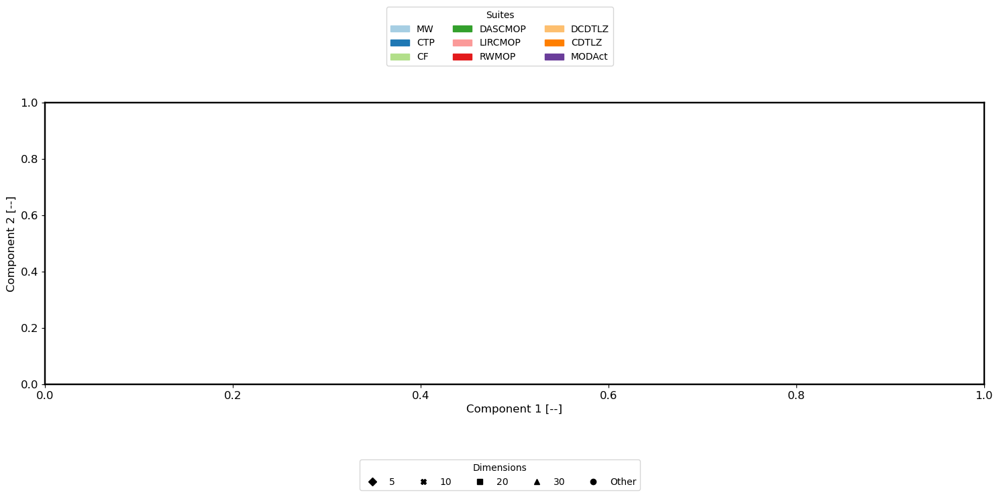

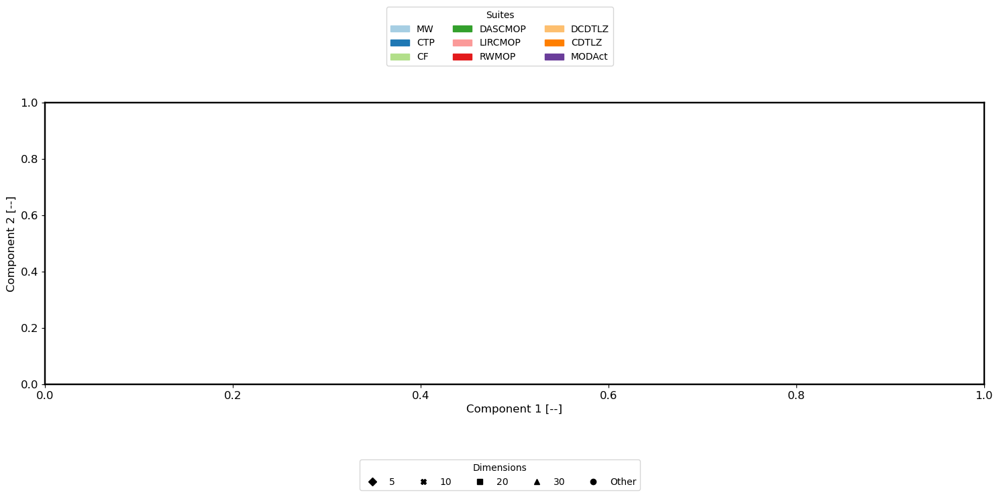

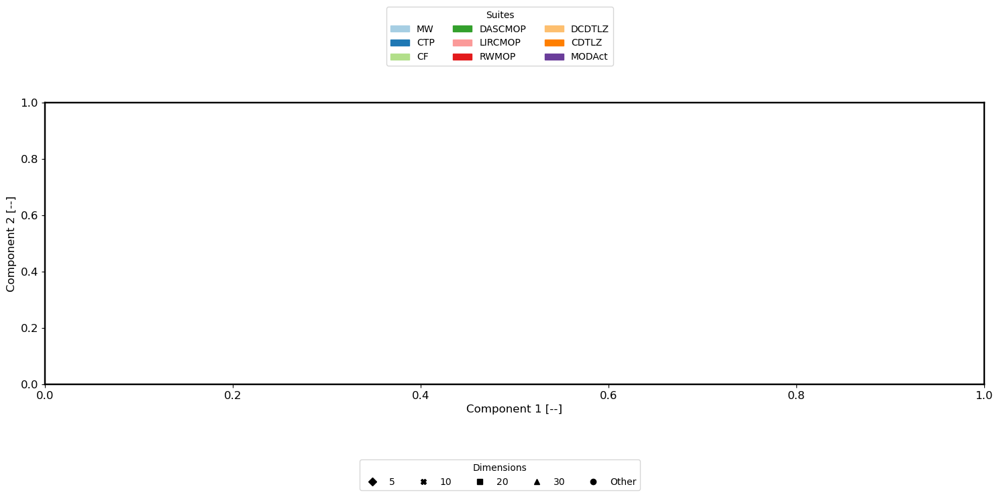

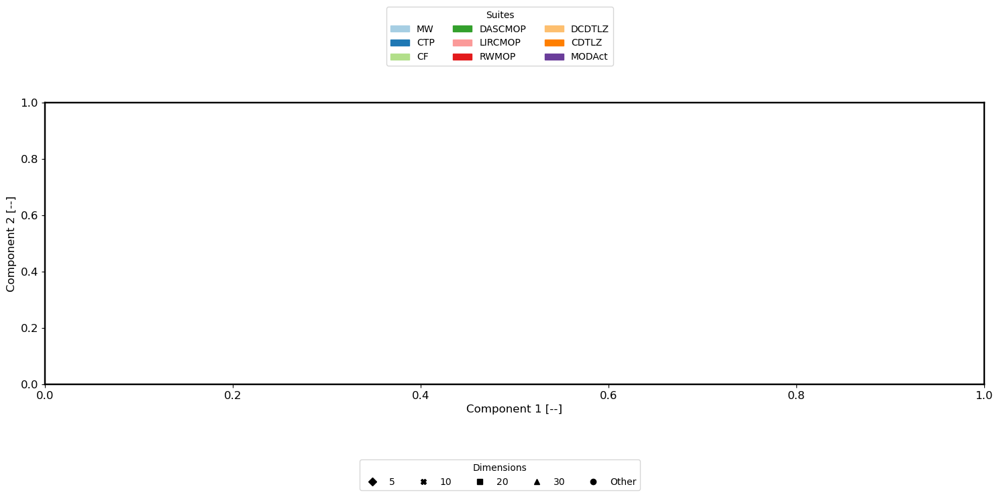

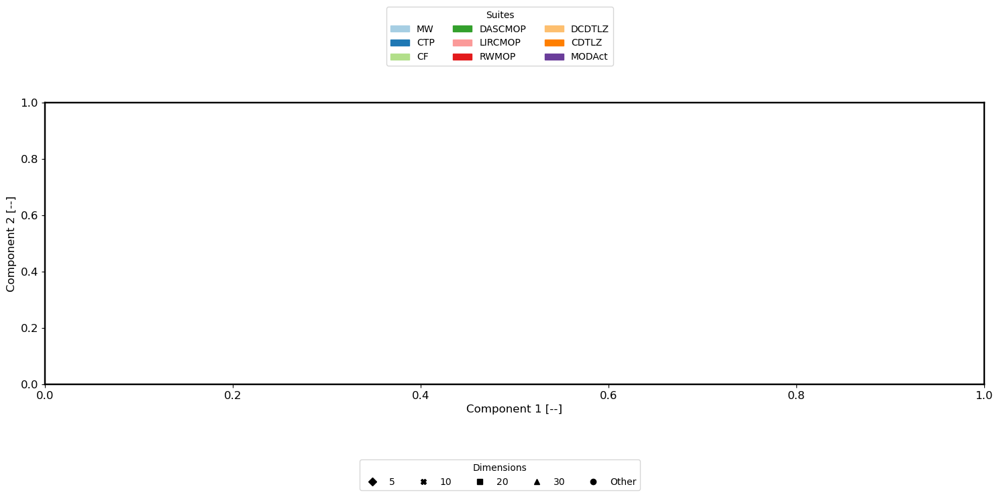

...

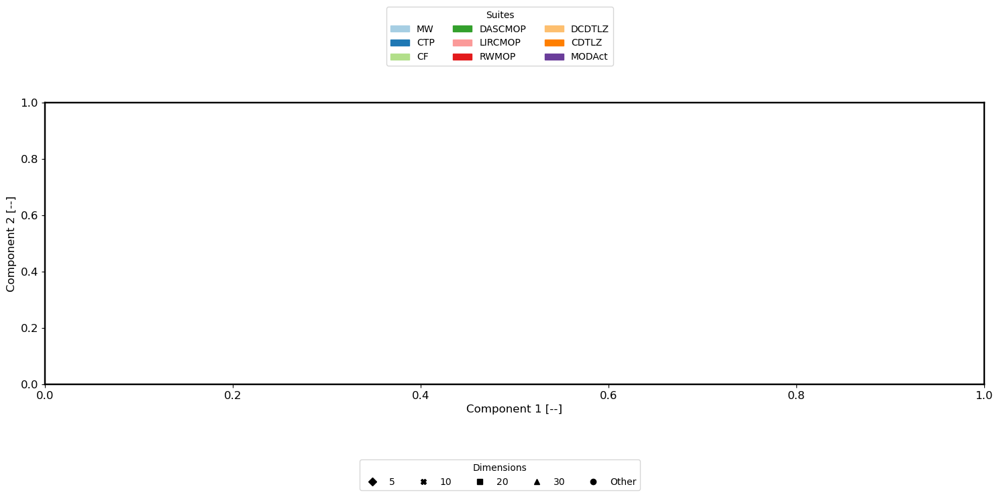

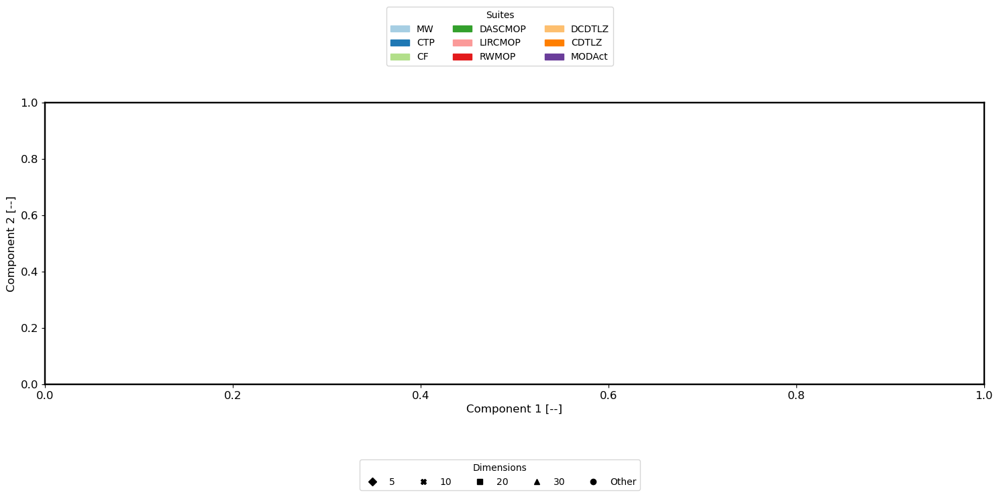

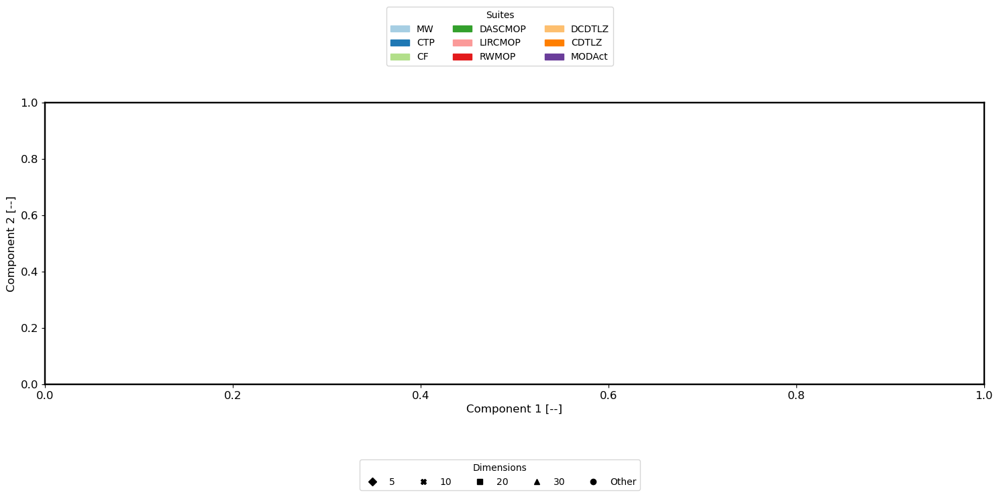

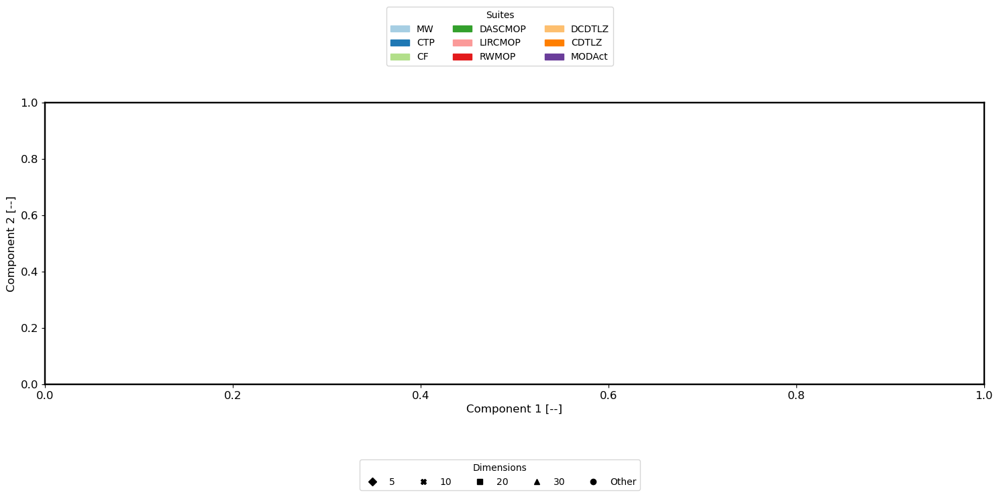

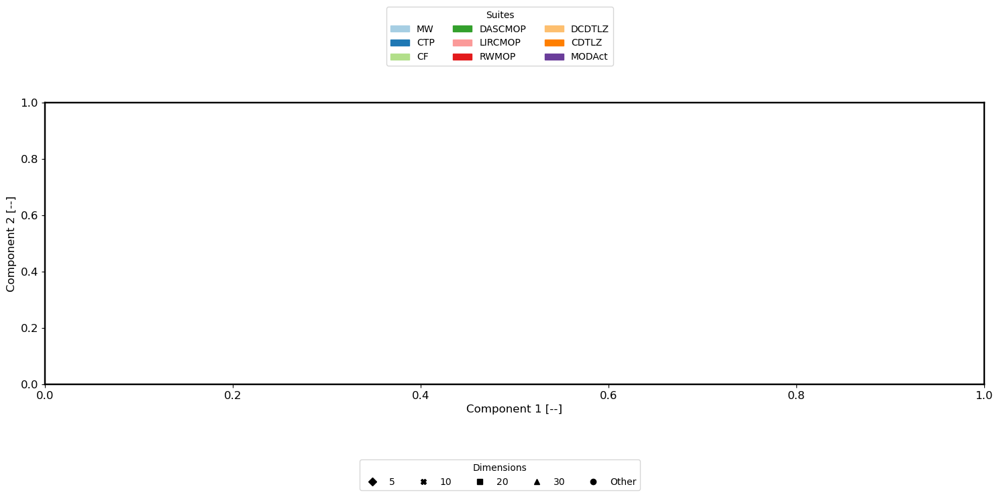

In [158]:
# Number of features analysis.
max_overall_features = 92
max_global_features = 45
max_rw_features = 39
num_features = [
    5,
    10,
    15,
    20,
    30,
    max_rw_features,
    max_global_features,
    70,
    max_overall_features,
]
trust_list_dimred = []
dashboards = [
    dashboard,
    global_dashboard,
    dashboard,
    global_dashboard,
    walk_dashboard,
]
num_seeds = 5

for ctr, d in enumerate(dashboards):

    # Assuming we alternate between overall and global only.
    if ctr in [0, 2]:
        feat_ranks = feature_ranks
    elif ctr in [4]:
        feat_ranks = top_rw_features
    else:
        feat_ranks = global_feature_ranks

    results = []

    for n in num_features:

        if n > max_global_features and ctr in [1, 3, 4]:
            continue
        elif n > max_rw_features and ctr in [4]:
            continue

        scores = []
        if ctr in [0, 1, 4]:
            # Use best features
            topfeatures = feat_ranks.head(n)
        elif ctr in [2, 3]:
            # Use worst features
            topfeatures = feat_ranks.tail(n)

        top_features_list = topfeatures.index.to_list()

        for random_state in range(num_seeds):
            dash_copy = copy.deepcopy(d)
            dash_copy.use_these_features_only(top_features_list)
            emb, labels = dash_copy.plot_UMAP(
                return_embedding=True,
                random_state=random_state,
                run_plotting=False,
                drop_these_probs=drop_these_probs,
            )

            score = dash_copy.get_trustworthiness_score(
                embedding_results=emb, original_data=trust_orig_data
            )
            scores.append(score)

            # Store the mean and standard deviation of scores for this perplexitu

        res_dict = {
            "Number of Features": n,
            "Mean Trustworthiness Score": np.mean(scores),
            "SD": np.std(scores),
        }

        results.append(res_dict)
    trust_list_dimred.append(pd.DataFrame(results))

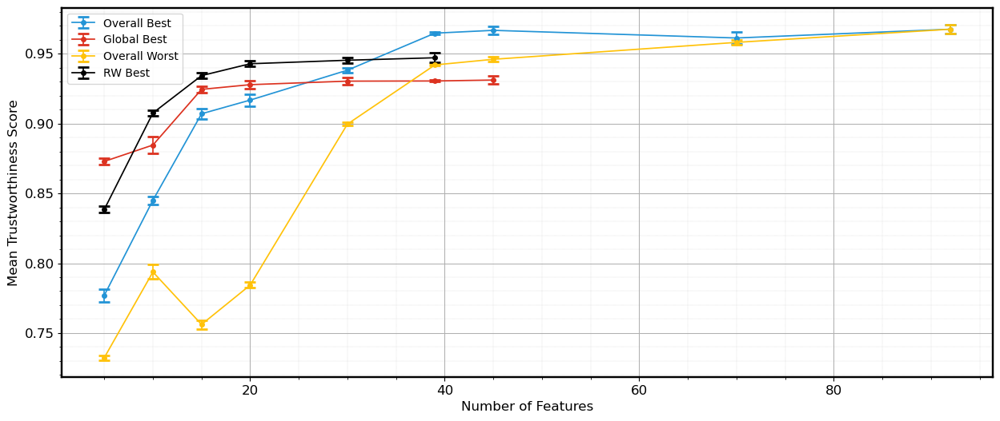

In [78]:
idx = [0, 1, 2, 4]
# idx = range(5)
results_to_plot = [trust_list_dimred[i] for i in idx]

dashboard.plot_dimreduction_perf_score(
    perf_results_list=results_to_plot,
    xlabel="Number of Features",
    labels=[
        r"Overall Best",
        r"Global Best",
        r"Overall Worst",
        # r"Global Worst",
        # r"Global Random",
        r"RW Best",
    ],
    join_points=True,
    filepath="Results/ImpactOfDimRed_Trustworthiness",
)

# Sensitivity Analysis of UMAP results (section 4.6)

In [ ]:
# Get reference dataset to evaluate low-dimensional embedding performance. This is the high-dimensional dataset that all low-dimensional approximations are compared to.
trust_orig_data = dashboard.get_comparison_data_for_trustworthiness()

## Trustworthiness as a function of noise

Show trustworthiness score versus noise scale factor for the following sets: overall, reduced overall, global, reduced global.



In [ ]:
_, _ = dashboard.get_filtered_df_for_dimension_reduced_plot()

In [ ]:
# These were copied from the output of the above. Need to make sure that each analysis methods considers the same set of problems.
drop_these_probs = [
    "MW13_d5",
    "CTP2_d5",
    "MW13_d10",
    "MW13_d20",
    "MW13_d30",
    "CF2_d20",
    "RWMOP20_d4",
]

In [ ]:
# Sensitivity analysis
noise_levels = [0, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 1]
trust_list_sens = []
dashboards = [dashboard, dash_reduced, global_dashboard, glob_reduced_dash]

for ctr, d in enumerate(dashboards):
    print(ctr)
    trust_results = d.run_dimreduced_sensitivity(
        method="umap",
        noise_levels=noise_levels,
        num_seeds=5,
        metric="trustworthiness",
        drop_these_probs=drop_these_probs,
        orig_data=trust_orig_data,
    )
    trust_list_sens.append(trust_results)

In [ ]:
dashboard.plot_dimreduction_perf_score(
    perf_results_list=trust_list_sens,
    xlabel="Noise Scale Factor",
    labels=[
        r"Overall ($n=92$)",
        r"Reduced ($n=15$)",
        r"Global ($n=45$)",
        r"Global Reduced ($n=15$)",
    ],
    filepath="Results/UMAPSensitivity_TrustworthinessScore",
    join_points=True,
)  # Figure 26 in report.

In [ ]:
noise_levels = [0.5, 1]
for n in noise_levels:
    dashboard.plot_UMAP(
        n_neighbors=[10],
        filepath=f"Results/UMAPOverall_Noise={n}",
        random_state=45,
        run_sensitivity_analysis=True,
        noise_scale_factor=n,
    )
# Figure 44 in report.

In [ ]:
noise_levels = [0.5, 1]

for n in noise_levels:
    glob_reduced_dash.plot_UMAP(
        n_neighbors=[10],
        filepath=f"Results/UMAPGlobalReduced_Noise={n}",
        random_state=45,
        run_sensitivity_analysis=True,
        ignore_aerofoils=False,
        train_with_aerofoils=True,
        noise_scale_factor=n,
    )

# Figure 45 in report.

## Feature rank deviation as a function of noise


## Overall (top half of table 6)


In [ ]:
feature_ranks_sens = dashboard.rank_each_feature()

In [ ]:
feature_ranks_sens

In [ ]:
# Run sensitivity analysis for overall features.
sens_reduced = dashboard.run_feature_selection_sensitivity_analysis(
    non_noisy_feature_scores=feature_ranks_sens,
    run_pca=False,
    num_samples=3,
    noise_levels=[0.05, 0.1, 0.2, 0.5],
)

In [ ]:
sens_reduced

In [ ]:
sens_cleaned = sens_reduced.rename(
    index={
        "MeanScore": "Overall Score (\%)",
        "OverallRank": "Overall Rank (out of 92)",
        "RF": "RF (\%)",
        "Coverage": "Coverage (\%)",
    }
)
sens_cleaned = sens_cleaned.loc[
    ["Coverage (\%)", "RF (\%)", "Overall Score (\%)", "Overall Rank (out of 92)"]
]
sens_cleaned

In [ ]:
FeaturesDashboard.convert_to_latex(
    sens_cleaned,
    filename="OverallFeatureScores_Sens",
    custom_format_index=False,
    significant_figures=1,
)

In [ ]:
global_feature_ranks_sens = global_dashboard.rank_each_feature()

## Global (bottom half of table 6)


In [ ]:
# Run sensitivity analysis for global only.
sens_glob = global_dashboard.run_feature_selection_sensitivity_analysis(
    non_noisy_feature_scores=global_feature_ranks_sens,
    run_pca=False,
    num_samples=3,
    noise_levels=[0.05, 0.1, 0.2, 0.5],
)

In [ ]:
sens_glob

In [ ]:
sens_cleaned = sens_glob.rename(
    index={
        "MeanScore": "Overall Score (\%)",
        "OverallRank": "Overall Rank (out of 45)",
        "RF": "RF (\%)",
        "Coverage": "Coverage (\%)",
    }
)
sens_cleaned = sens_cleaned.loc[
    ["Coverage (\%)", "RF (\%)", "Overall Score (\%)", "Overall Rank (out of 45)"]
]
sens_cleaned

In [ ]:
FeaturesDashboard.convert_to_latex(
    sens_cleaned,
    filename="GlobalFeatureScores_Sens",
    custom_format_index=False,
    significant_figures=1,
)

# Literature Comparison (section 4.7 of report)

The following papers ranked their features relative to an algorithm performance predictive model:

- Vodopija2022
- Alsouly2022
- Liefooghe2021

Will see how well these features describe the dataset I have.


In [ ]:
# Use this in the case of copying incorrectly.
# dashboard.set_dashboard_analysis_type(analysis_type="all")

In [161]:
def rank_literature_features(features, orig_dash):
    dash = copy.deepcopy(orig_dash)
    dash.use_these_features_only(
        features_to_keep=features, use_pre_ignored=False
    )
    dash.ignore_ps_pf_features()
    
    # Look at how these ranked in our study.
    ranks = feature_ranks.loc[
        [f for f in features if f in feature_ranks.index]
    ]
    return dash, ranks

### Alsouly2022

Looked at their top 13 features that they considered for ISA (ignoring ps_dist_iqr which we do not evaluate).


In [162]:
alsouly_features = [
    "corr_cv_ranks_glob",  # corr_cf
    "rk_uc_mdl_r2_glob",  # f_mdl_r2
    "dist_c_corr_glob",
    "min_cv_glob",
    "bhv_avg_rw",
    "skew_rnge_glob",
    "piz_ob_min_glob",
    "dist_c_dist_x_avg_rw",
    "cpo_upo_n_glob",
    "cv_range_coeff_glob",
    "corr_obj_min_glob",  # corr obj
    "dist_f_dist_x_avg_rw",
    "cv_mdl_r2_glob",
]
alsouly_dash, alsouly_ranks = rank_literature_features(features=alsouly_features, orig_dash=dashboard)

All specified features have been considered


Aerofoils are being ignored for analysis type: all.
Dropped instances:
['CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 5
This dataframe contains 13 features.


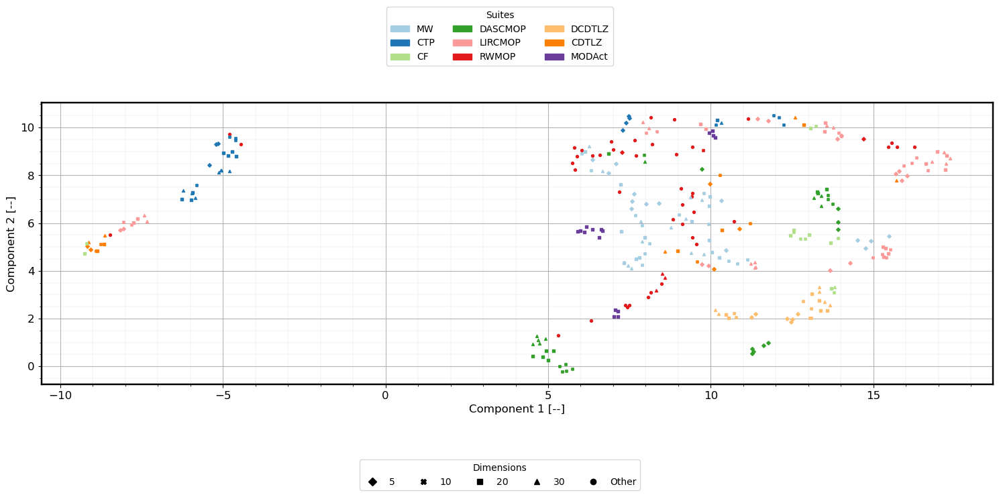

In [163]:
# Figure 37 in report
alsouly_dash.plot_UMAP(filepath="Results/UMAP_Alsouly")

### Vodopija2022

Looked at all features that we replicated. Note that some features requiring clustering from the Vodopija paper were not implemented.


In [164]:
# Will consider all Vodopija features that we replicated.
vodopija_features = [
    "m0_glob",
    "eps_s_glob",
    "H_max_glob",
    "m0_rw",  # technically Vodopija only did for global
    "eps_s_rw",  # technically Vodopija only did for global
    "H_max_rw",  # technically Vodopija only did for global
    "fsr_glob",
    "corr_obj_min_glob",
    "corr_obj_max_glob",
    "length_avg_aw",  # proxy for size of basins
    "nrfbx_rw",  # mean ratio of feasible boundary crossings
]
vodopija_dash, vodopija_ranks = rank_literature_features(features=vodopija_features, orig_dash=dashboard)

All specified features have been considered


Aerofoils are being ignored for analysis type: all.
Dropped instances:
[]
Initial length of the dataframe: 305
Total number of dropped instances: 0
This dataframe contains 11 features.


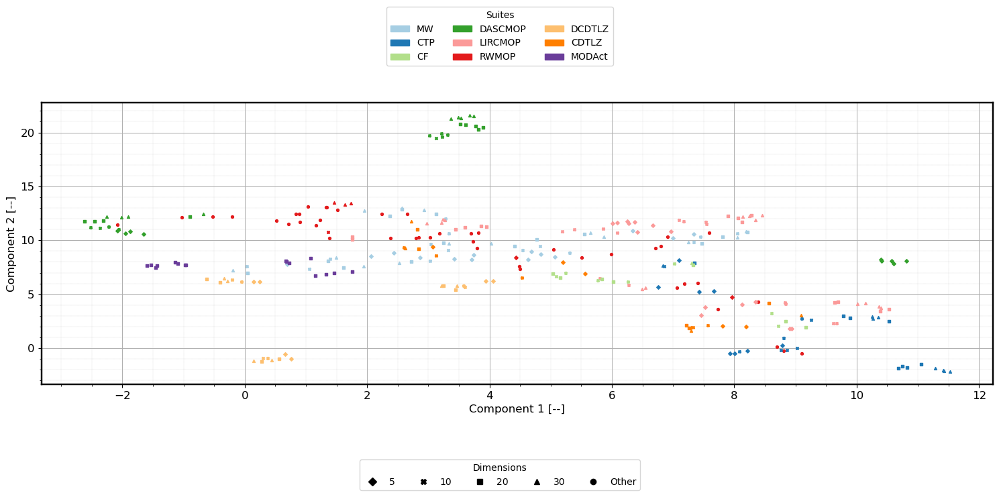

In [165]:
# Figure 38 in report.
vodopija_dash.plot_UMAP(filepath="Results/UMAP_Vodopija")

### Lifeooghe2021

Looked at their top most important features for the three algorithm selection models. They considered unconstrained MOPs only, so we expect their features to not be as useful for distinguishing between CMOPs.


In [166]:
liefooghe_features = [
    "dist_f_avg_rw",  # they call this dist_f_avg_neig
    "dist_f_dist_x_avg_rw",  # they call this dist_f_dist_x_avg_neig
    "uhv_ss_avg_rw",  # they call this hv_avg_neig
    "hvd_r1_rw",  # called hv_corr
    "nhv_avg_rw",
    "nhv_r1_rw",
    "hv_est_glob",  # called hv
    "hv_ss_r1_rw",  # called hv_cor_neig
    "length_avg_aw",  # called eval_aws
    "sup_r1_rw",  # called sup_corr_neig
    "inc_avg_rw",
]
liefooghe_dash, liefooghe_ranks = rank_literature_features(features=liefooghe_features, orig_dash=dashboard)

All specified features have been considered


Aerofoils are being ignored for analysis type: all.
Dropped instances:
[]
Initial length of the dataframe: 305
Total number of dropped instances: 0
This dataframe contains 11 features.


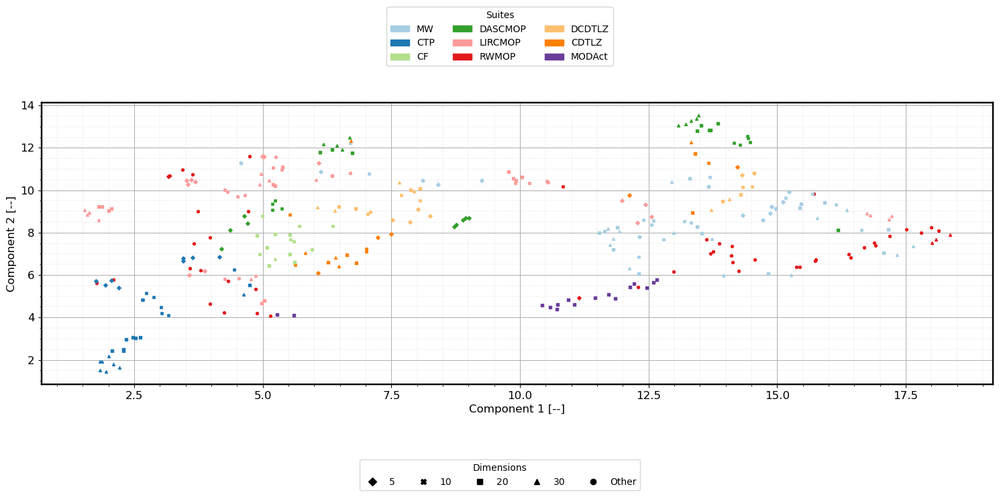

In [167]:
liefooghe_dash.plot_UMAP(filepath="Results/UMAP_Liefooghe")

### Novel feature set

We will compare the literature results to the results from our novel process.

In [168]:
# Recompute best features on the reduced set of problems. The same problems are automatically removed from the previous 
dash_less_probs = copy.deepcopy(dashboard)
overall_feat_ranks_less_probs = dash_less_probs.rank_each_feature(
    drop_these_probs=drop_these_probs
)

Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dataframe contains 92 features.
This RF model training has considered 92 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      1.00      1.00         4
          CF       1.00      1.00      1.00         1
         CTP       1.00      1.00      1.00         4
     DASCMOP       1.00      1.00      1.00        11
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        16
      MODAct   

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.75      0.75      0.75         4
          CF       1.00      0.50      0.67         2
         CTP       1.00      1.00      1.00         7
     DASCMOP       1.00      1.00      1.00         4
      DCDTLZ       1.00      1.00      1.00         8
     LIRCMOP       0.91      1.00      0.95        10
      MODAct       1.00      1.00      1.00         6
          MW       0.86      1.00      0.92         6
       RWMOP       0.92      0.85      0.88        13

    accuracy                           0.93        60
   macro avg       0.94      0.90      0.91        60
weighted avg       0.94      0.93      0.93        60

Accuracy Score: 0.9333333333333333
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'CTP2_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 7
This dat

In [169]:
overall_feat_ranks_less_probs

,Type,Coverage,RF,CoverageMean,RFMean,MeanScore,OverallRank
rk_uc_mdl_r2_glob,Global,0.805541,0.956943,0.805541,0.956943,0.881242,1.0
uhv_ss_r1_rw,RW,1.000000,0.626991,1.000000,0.626991,0.813495,2.0
corr_obj_uc_rk_max_glob,Global,0.593640,1.000000,0.593640,1.000000,0.796820,3.0
nuhv_r1_rw,RW,0.954873,0.526328,0.954873,0.526328,0.740600,4.0
corr_obj_min_glob,Global,0.595568,0.881345,0.595568,0.881345,0.738456,5.0
...,...,...,...,...,...,...,...
lnd_avg_aw,AW,0.191323,0.047745,0.191323,0.047745,0.119534,88.0
min_cv_glob,Global,0.198613,0.038333,0.198613,0.038333,0.118473,89.0
po_n_glob,Global,0.047115,0.138883,0.047115,0.138883,0.092999,90.0
corr_obj_uc_rk_min_glob,Global,0.113018,0.000880,0.113018,0.000880,0.056949,91.0


In [170]:
global_full_features_df, cols = (
    global_dashboard.get_filtered_df_for_dimension_reduced_plot(
        ignore_features=False, ignore_scr=True
    )
)
filtered_glob_df = FeaturesDashboard.get_numerical_data_from_df(global_full_features_df)
global_dash_less_probs = copy.deepcopy(global_dashboard)
global_dash_less_probs.use_these_features_only(
    [f.replace("_mean", "") for f in cols], use_pre_ignored=False
)
global_dash_less_probs.ignore_ps_pf_features()
global_feat_ranks_less_probs = global_dash_less_probs.rank_each_feature(
    drop_these_probs=drop_these_probs
)

This dataframe contains 56 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 48 features.
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe contains 48 features.
This RF model training has considered 48 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.75      0.86         4
          CF       0.00      0.00      0.00         1
         CTP       1.00      1.00      1.00         4
     DASCMOP       1.00      0.91      0.95        11
      DCDTLZ       1.00      1.00      1.00         5
     LIR

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.80      0.89         5
          CF       1.00      1.00      1.00         1
         CTP       1.00      1.00      1.00         4
     DASCMOP       1.00      1.00      1.00         9
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        12
      MODAct       1.00      1.00      1.00         4
          MW       0.83      1.00      0.91        10
       RWMOP       1.00      0.90      0.95        10

    accuracy                           0.97        60
   macro avg       0.98      0.97      0.97        60
weighted avg       0.97      0.97      0.97        60

Accuracy Score: 0.9666666666666667
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe con

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.67      1.00      0.80         4
          CF       1.00      1.00      1.00         2
         CTP       1.00      1.00      1.00         3
     DASCMOP       0.89      1.00      0.94         8
      DCDTLZ       1.00      1.00      1.00         8
     LIRCMOP       1.00      1.00      1.00        11
      MODAct       1.00      1.00      1.00         3
          MW       0.88      0.78      0.82         9
       RWMOP       1.00      0.83      0.91        12

    accuracy                           0.93        60
   macro avg       0.94      0.96      0.94        60
weighted avg       0.94      0.93      0.93        60

Accuracy Score: 0.9333333333333333
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 6
This dataframe con

In [171]:
walk_dashboard_full_features_df, cols = (
    walk_dashboard.get_filtered_df_for_dimension_reduced_plot(
        ignore_features=False, ignore_scr=True
    )
)
filtered_rw_df = FeaturesDashboard.get_numerical_data_from_df(walk_dashboard_full_features_df)
rw_dash_less_probs = copy.deepcopy(walk_dashboard)
rw_dash_less_probs.use_these_features_only(
    [f.replace("_mean", "") for f in cols], use_pre_ignored=False
)
rw_feat_ranks_less_probs = rw_dash_less_probs.rank_each_feature(
    drop_these_probs=drop_these_probs
)

This dataframe contains 48 features.
All specified features have been considered
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 48 features.
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 48 features.
This RF model training has considered 48 features.
Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.50      0.67         4
          CF       0.50      1.00      0.67         1
         CTP       1.00      1.00      1.00         4
     DASCMOP       0.92      1.00      0.96        11
      DCDTLZ       1.00      1.00      1.00         5
     LIRCMOP       1.00      1.00      1.00        16
      MODAct       1.00      1.0

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.50      0.67         4
          CF       1.00      0.25      0.40         4
         CTP       1.00      1.00      1.00         6
     DASCMOP       0.71      1.00      0.83         5
      DCDTLZ       1.00      1.00      1.00         4
     LIRCMOP       0.80      1.00      0.89        12
      MODAct       1.00      1.00      1.00         1
          MW       0.82      0.82      0.82        11
       RWMOP       0.85      0.85      0.85        13

    accuracy                           0.85        60
   macro avg       0.91      0.82      0.83        60
weighted avg       0.87      0.85      0.84        60

Accuracy Score: 0.85
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 48 features.
This RF model training has conside

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       0.67      1.00      0.80         2
          CF       1.00      0.80      0.89         5
         CTP       1.00      1.00      1.00         4
     DASCMOP       0.85      1.00      0.92        11
      DCDTLZ       1.00      1.00      1.00         4
     LIRCMOP       1.00      0.89      0.94        18
      MODAct       1.00      1.00      1.00         3
          MW       0.88      1.00      0.93         7
       RWMOP       1.00      0.83      0.91         6

    accuracy                           0.93        60
   macro avg       0.93      0.95      0.93        60
weighted avg       0.95      0.93      0.93        60

Accuracy Score: 0.9333333333333333
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 48 features.
This RF model traini

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.50      0.67         2
          CF       0.80      1.00      0.89         4
         CTP       1.00      1.00      1.00         4
     DASCMOP       1.00      1.00      1.00        12
      DCDTLZ       1.00      1.00      1.00         4
     LIRCMOP       1.00      1.00      1.00        12
      MODAct       1.00      1.00      1.00         4
          MW       1.00      0.90      0.95        10
       RWMOP       0.89      1.00      0.94         8

    accuracy                           0.97        60
   macro avg       0.97      0.93      0.94        60
weighted avg       0.97      0.97      0.96        60

Accuracy Score: 0.9666666666666667
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 48 features.
This RF model traini

c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\richa\anaconda3\envs\cosc2002_env\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

       CDTLZ       1.00      0.50      0.67         4
          CF       0.67      1.00      0.80         2
         CTP       1.00      1.00      1.00         6
     DASCMOP       1.00      0.89      0.94         9
      DCDTLZ       1.00      1.00      1.00         2
     LIRCMOP       1.00      0.87      0.93        15
          MW       0.69      1.00      0.81        11
       RWMOP       0.90      0.82      0.86        11

    accuracy                           0.88        60
   macro avg       0.91      0.88      0.88        60
weighted avg       0.91      0.88      0.88        60

Accuracy Score: 0.8833333333333333
Aerofoils are being ignored for analysis type: rw.
Dropped instances:
['CTP2_d5', 'MW13_d20', 'MW13_d30']
Initial length of the dataframe: 305
Total number of dropped instances: 3
This dataframe contains 48 features.
This RF model training has considered 48 features.
Classification Report:


In [172]:
rw_feat_ranks_less_probs

,Type,Coverage,RF,CoverageMean,RFMean,MeanScore,OverallRank
uhv_ss_r1_rw,RW,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
nuhv_r1_rw,RW,0.951421,0.817507,0.951421,0.817507,0.884464,2.0
uhvd_avg_rw,RW,0.640519,0.883208,0.640519,0.883208,0.761864,3.0
dist_f_r1_rw,RW,0.679891,0.836533,0.679891,0.836533,0.758212,4.0
m0_rw,RW,0.662068,0.821804,0.662068,0.821804,0.741936,5.0
dist_f_dist_x_r1_rw,RW,0.667979,0.772953,0.667979,0.772953,0.720466,6.0
H_max_rw,RW,0.612499,0.652737,0.612499,0.652737,0.632618,7.0
uhv_ss_avg_rw,RW,0.400002,0.768026,0.400002,0.768026,0.584014,8.0
nuhv_avg_rw,RW,0.424948,0.730054,0.424948,0.730054,0.577501,9.0
eps05_rw,RW,0.390906,0.712798,0.390906,0.712798,0.551852,10.0


### Bringing all of the sets together.
We now evaluate the trustworthiness of each set of feature values, relative to the original high-dimensional dataset.

In [173]:
# Determine full feature set.
full_features_df, cols = dashboard.get_filtered_df_for_dimension_reduced_plot(
    ignore_features=False,
)
full_features_df = full_features_df[~full_features_df["Name"].isin(drop_these_probs)]
full_features_df = full_features_df[
    [f for f in full_features_df.columns if not f.startswith(("PS", "PF"))]
]
cols = [c for c in cols if not c.startswith(("PS", "PF"))]
full_features_df[cols].dropna().shape

This dataframe contains 116 features.


(298, 108)

In [174]:
trust_lit_orig_data = trust_orig_data

--------------------0-----------------------
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20']
Initial length of the dataframe: 305
Total number of dropped instances: 5
This dataframe contains 15 features.
--------------------1-----------------------
All specified features have been considered
Aerofoils are being ignored for analysis type: glob.
Dropped instances:
['MW13_d5', 'MW13_d10', 'MW13_d20', 'MW13_d30', 'CF2_d20']
Initial length of the dataframe: 305
Total number of dropped instances: 5
This dataframe contains 15 features.
--------------------2-----------------------
All specified features have been considered
Aerofoils are being ignored for analysis type: all.
Dropped instances:
['MW13_d10', 'MW13_d20', 'MW13_d30', 'RWMOP20_d4']
Initial length of the dataframe: 305
Total number of dropped instances: 4
This dataframe contains 15 features.
-----------------

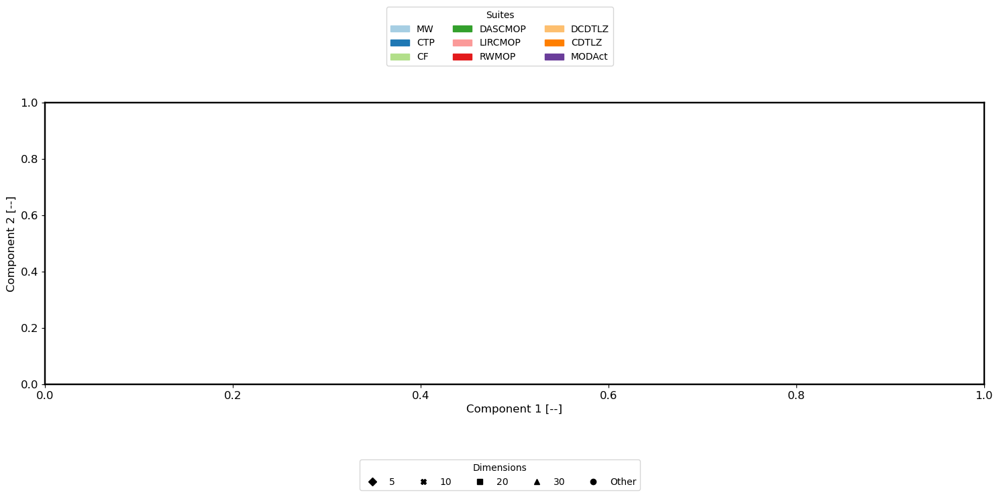

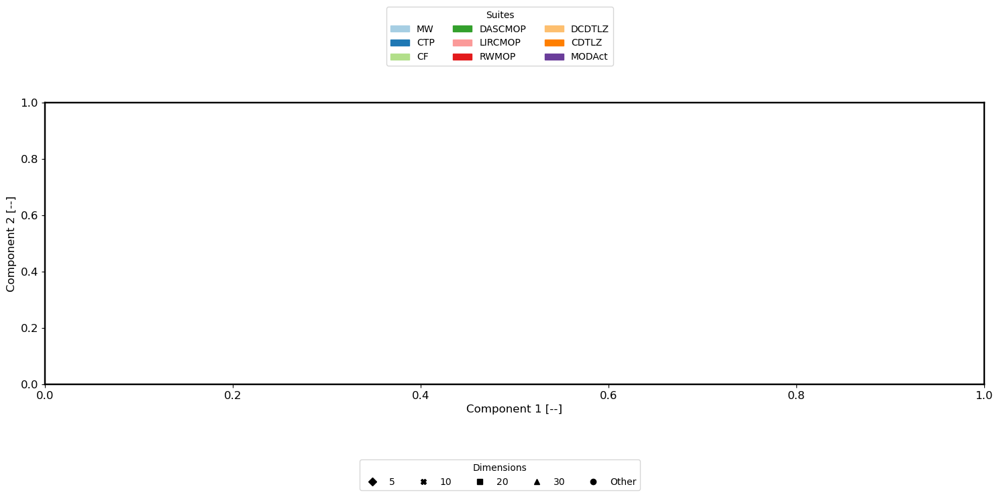

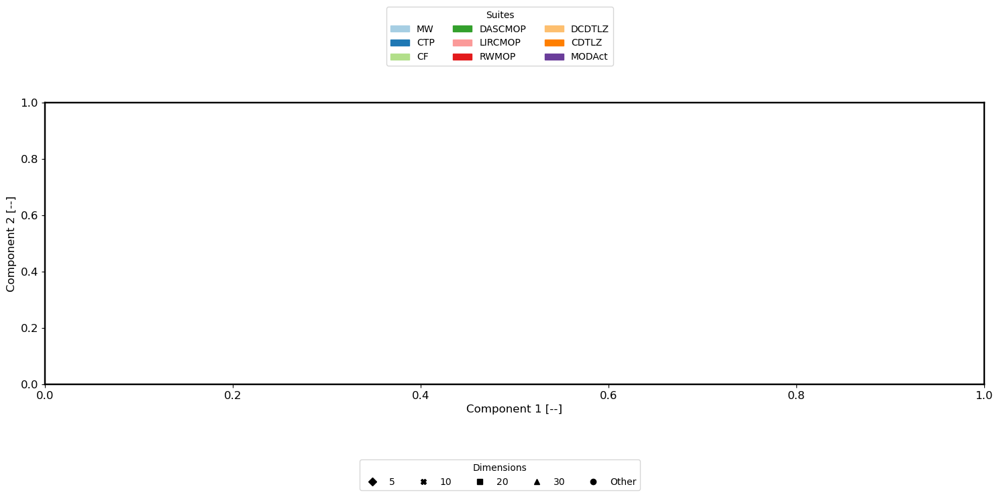

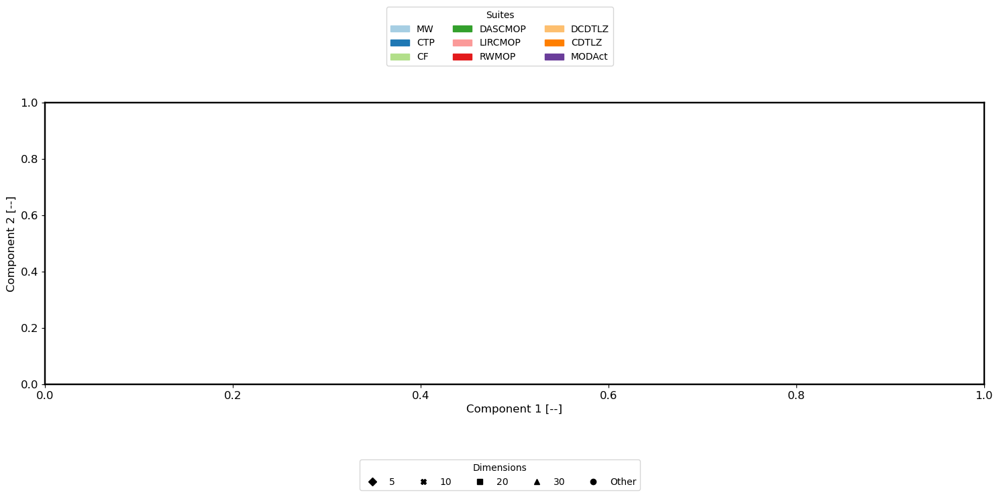

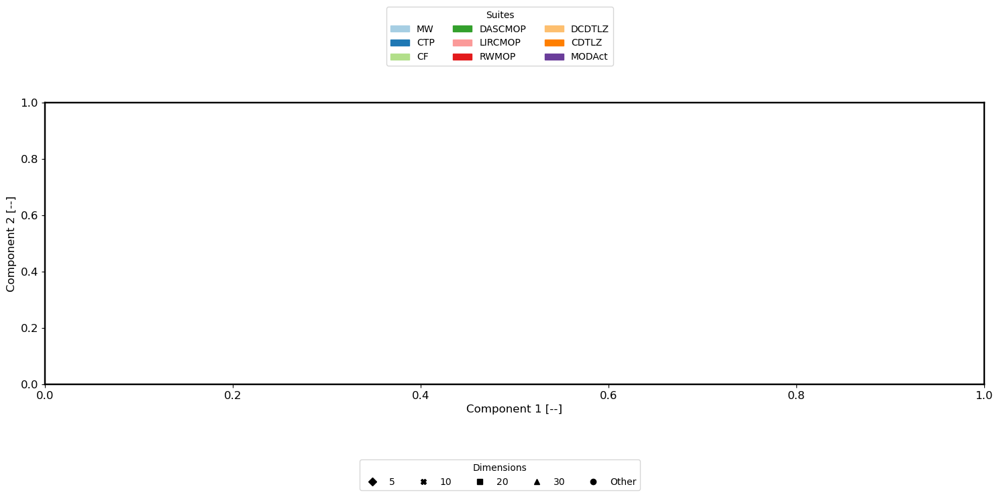

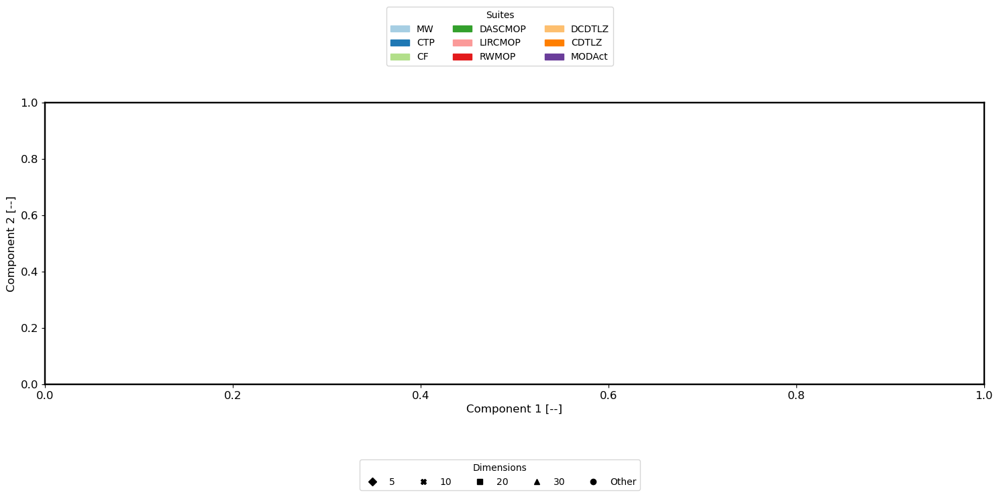

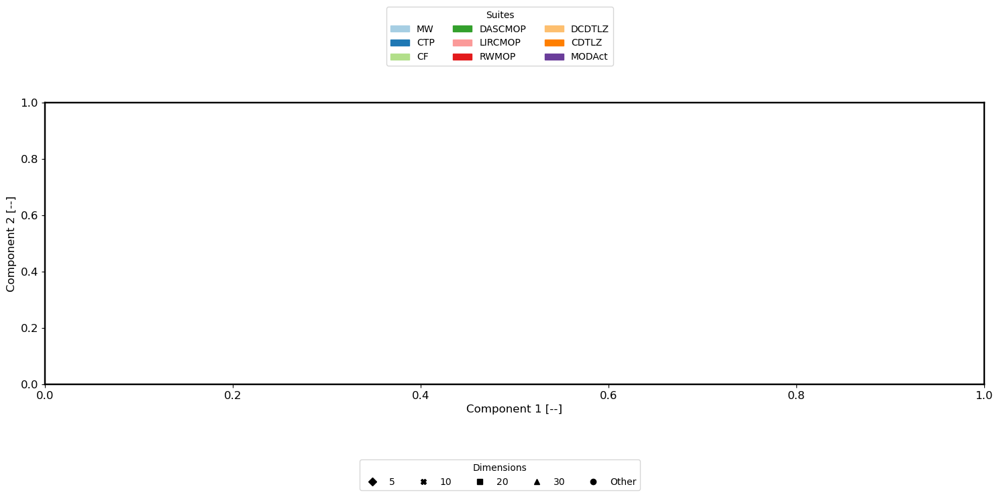

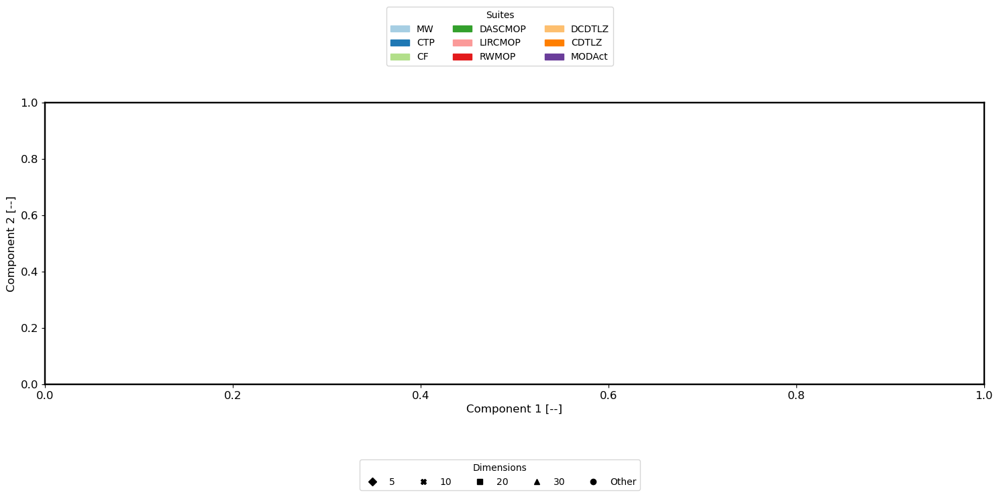

In [175]:
# Trustworthiness analysis.
trust_list_lit = []
dashboards = [
    dash_less_probs,
    global_dash_less_probs,
    dash_less_probs,
    global_dash_less_probs,
    dashboard,
    dashboard,
    dashboard,
    rw_dash_less_probs,
]
names = [
    "Overall Best",
    "Global Best",
    "Overall Worst",
    "Global Worst",
    "Alsouly et al.",
    "Vodopija et al.",
    "Liefooghe et al.",
    "RW Best",
]
# num_seeds = 5
num_seeds = 1
n_features = 15

for ctr, d in enumerate(dashboards):
    
    print(f"--------------------{ctr}-----------------------")

    # Assuming we alternate between overall and global only.
    if ctr in [0, 2]:
        feat_ranks = overall_feat_ranks_less_probs
    elif ctr in [1, 3]:
        feat_ranks = global_feat_ranks_less_probs
    elif ctr == 4:
        feat_ranks = alsouly_features
        other_dash = alsouly_dash
    elif ctr == 5:
        feat_ranks = vodopija_features
        other_dash = vodopija_dash
    elif ctr == 6:
        feat_ranks = liefooghe_features
        other_dash = liefooghe_dash
    elif ctr == 7:
        feat_ranks = rw_feat_ranks_less_probs
    results = []

    scores = []
    if ctr in [0, 1, 7]:
        # Use best features
        topfeatures = feat_ranks.head(n_features)
    elif ctr in [2, 3]:
        # Use worst features
        topfeatures = feat_ranks.tail(n_features)
    # elif ctr == 7:
    #     topfeatures = feat_ranks.sample(n=n_features, random_state=random_state)

    else:
        topfeatures = feat_ranks

    if not isinstance(topfeatures, list):
        top_features_list = topfeatures.index.to_list()
    else:
        top_features_list = topfeatures

    if ctr > 3:
        use_pre_ignored = False
    else:
        use_pre_ignored = True

    for random_state in range(num_seeds):
        dash_copy = copy.deepcopy(d)
        dash_copy.use_these_features_only(
            top_features_list, use_pre_ignored=use_pre_ignored
        )
        dash_copy.ignore_ps_pf_features()  # bane of my existence
        emb, labels = dash_copy.plot_UMAP(
            return_embedding=True,
            random_state=random_state,
            run_plotting=False,
            drop_these_probs=drop_these_probs,
        )

        score = dash_copy.get_trustworthiness_score(
            embedding_results=emb, original_data=trust_orig_data
        )
        scores.append(score)

    res_dict = {
        "Feature Set": names[ctr],
        "Mean Trustworthiness Score": np.mean(scores),
        "SD": np.std(scores),
    }

    results.append(res_dict)
    trust_list_lit.append(pd.DataFrame(results))

In [176]:
trust_df_lit = pd.concat(trust_list_lit)
trust_df_lit

,Feature Set,Mean Trustworthiness Score,SD
0,Overall Best,0.903178,0.0
0,Global Best,0.923186,0.0
0,Overall Worst,0.753670,0.0
0,Global Worst,0.803027,0.0
0,Alsouly et al.,0.914441,0.0
0,Vodopija et al.,0.917909,0.0
0,Liefooghe et al.,0.890555,0.0
0,RW Best,0.937054,0.0


In [177]:
def reorder_dataframe_by_feature_type(df, order_list, column_name="Feature Set"):
    """
    Reorders the rows of a dataframe based on a specific column and a given order.

    Args:
        df (pd.DataFrame): The dataframe to reorder.
        order_list (list): The list defining the desired order of values in the specified column.
        column_name (str): The column name to reorder by. Default is "Feature Type".

    Returns:
        pd.DataFrame: A reordered dataframe based on the specified column and order list.
    """
    # Ensure the specified column is treated as a categorical type with the given order
    df[column_name] = pd.Categorical(
        df[column_name], categories=order_list, ordered=True
    )

    # Sort the dataframe by the specified column
    df = df.sort_values(by=column_name)

    return df


order_list = [
    "Overall Best",
    "Global Best",
    "RW Best",
    "Overall Worst",
    "Global Worst",
    "Alsouly et al.",
    "Vodopija et al.",
    "Liefooghe et al.",
]

trust_df_lit = reorder_dataframe_by_feature_type(trust_df_lit, order_list)
trust_df_lit

,Feature Set,Mean Trustworthiness Score,SD
0,Overall Best,0.903178,0.0
0,Global Best,0.923186,0.0
0,RW Best,0.937054,0.0
0,Overall Worst,0.753670,0.0
0,Global Worst,0.803027,0.0
0,Alsouly et al.,0.914441,0.0
0,Vodopija et al.,0.917909,0.0
0,Liefooghe et al.,0.890555,0.0


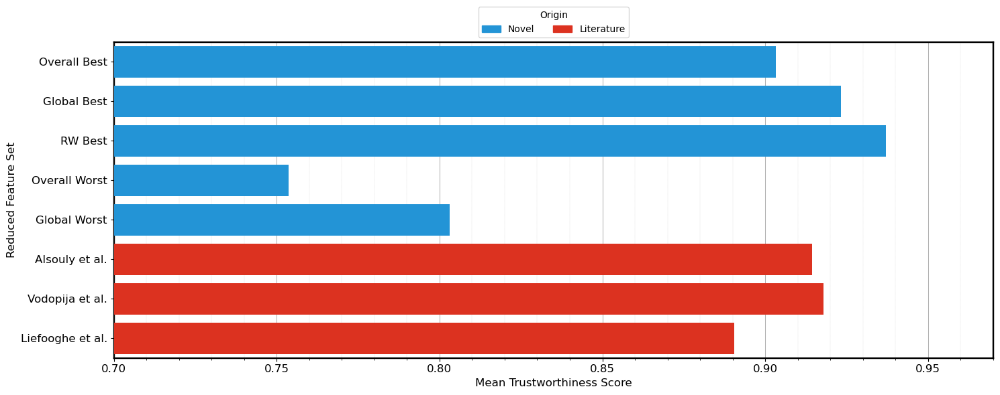

In [178]:
filepath = "Results/LiteratureComparison_Trustworthiness"
dashboard.plot_trustworthiness_comparison_of_feature_sets(trust_df = trust_df_lit, filepath=filepath)

Generating tables of feature scores for literature features.

In [179]:
def get_ranking_table(ranks_df, authorname):
    # Sort the dataframe by 'OverallRank'
    ranks_df = ranks_df.sort_values(by="OverallRank")

    # Create a new dataframe with the sorted indices and ranks_df
    table = pd.DataFrame(index=ranks_df.index)
    table["Type"] = ranks_df["Type"]
    table["RF"] = ranks_df["RF"]
    table["Coverage"] = ranks_df["Coverage"]
    table["Overall Score"] = ranks_df["Overall Score"]
    table["Rank"] = ranks_df["OverallRank"].round().astype(int)

    dashboard.convert_to_latex(
        df=table,
        filename=f"{authorname}Rankings",
        significant_figures=3,
    )

In [180]:
# Tables 18-20
get_ranking_table(alsouly_ranks, "Alsouly")
get_ranking_table(vodopija_ranks, "Vodopija")
get_ranking_table(liefooghe_ranks, "Liefooghe")

# Detailed Aerofoils Analysis (section 4.8 of report)


In [ ]:
# Figure 28 in report. Coverage is measured relative to aerofoils here.
glob_reduced_dash.plot_coverage_heatmap(
    target_suite="XA",
    top_features=15,
    filepath="Results/AerofoilCoverage",
    ignore_aerofoils=False,
)

In [ ]:
glob_cov = global_dashboard.get_feature_coverage(
    target_suite="XA", run_sensitivity_analysis=False, ignore_aerofoils=False
)
glob_cov = dashboard.get_top_coverage_features(coverage_values=glob_cov, aslist=False)
dashboard.convert_to_latex(
    glob_cov,
    filename="GlobalCoverage_XA",
    include_columns=False,
    significant_figures=3,
)  # Table 17 in report

In [ ]:
special_suites = ["XA"]
glob_reduced_dash.generate_suite_colors()

for s in special_suites:
    cov = glob_reduced_dash.get_feature_coverage(target_suite=s, ignore_aerofoils=False)
    worst_feat = glob_reduced_dash.get_top_coverage_features(
        cov, aslist=True, top_features=5
    )

    glob_reduced_dash.plot_parallel_coordinates(
        features=worst_feat,
        separate_rw_analytical=False,
        suites_in_focus=["XA", "MODAct"],
        ignore_aerofoils=False,
        filepath=f"Results/ParallelCoords_{s}",
    )

# Figure 29 in report.

In [ ]:
glob_reduced_dash.plot_features_comparison(
    feature_x="scr_glob",
    feature_y="fsr_glob",
    suite_names=["XA"],
    ignore_aerofoils=False,
    filepath="Results/SCR_versus_FSR",
)

# Illustrative report figures
These are more illustrative figures required for Intro, lit review and methodology

## Walks


In [ ]:
dashboard.define_plot_sizes()
dashboard.apply_custom_colors(palette="Dries")
dashboard.plot_walk_for_report(walk_type="random_walks", filepath="Theory/RandomWalks")
dashboard.plot_walk_for_report(walk_type="neigs", filepath="Theory/WalkNeighbourhood")
dashboard.plot_walk_for_report(
    walk_type="adaptive_walk_dec", filepath="Theory/AdaptiveWalkSearchSpace"
)
dashboard.plot_walk_for_report(
    walk_type="adaptive_walk_obj", filepath="Theory/AdaptiveWalkObjectiveSpace"
)

In [ ]:
dashboard.apply_custom_matplotlib_style()
plt.plot()
plt.xlabel(r"\texttt{Hello There}")
plt.show()

In [ ]:
dashboard.plot_multiple_random_walks_for_report(
    walk_type="simple", filepath="Theory/FourSimpleWalks"
)

In [ ]:
dashboard.plot_multiple_random_walks_for_report(
    walk_type="prog", filepath="Theory/FourProgWalks"
)

## Generating some landscape plots for the report


In [ ]:
# Recalculate z values with the new range
def z_evolvable(x, y):
    return -200 * np.exp(-0.2 * np.sqrt(x**2 + y**2))


dashboard.plot_landscape_for_report(
    z_evolvable, filepath="Theory/SampleLandscape_Evolvable"
)

In [ ]:
# Recalculate z values with the new range
def z_not_evolvable(
    x,
    y,
):
    return -150 * np.exp(-0.2 * np.sqrt((x - 3) ** 2 + (y - 3) ** 2)) - 200 * np.exp(
        -0.2 * np.sqrt((x + 5) ** 2 + (y + 6) ** 2)
    )


dashboard.plot_landscape_for_report(
    z_not_evolvable, elev_azi=(30, 15), filepath="Theory/SampleLandscape_Deceptive"
)

In [ ]:
def z_rugged(x, y):
    return x * np.sin(0.75 * np.abs(x)) + y * np.sin(0.75 * np.abs(y))


dashboard.plot_landscape_for_report(
    z_rugged,
    contour_offset=3,
    num_contours=8,
    filepath="Theory/SampleLandscape_Rugged",
)

In [ ]:
# def z_smooth(x, y):
#     return 4 * x**2 - 2.1 * x**4 + 1 / 3 * x**6 + x * y - 4 * y**2 + 4 * y**4


def z_smooth(x, y):

    return x**2 + y**2


dashboard.plot_landscape_for_report(z_smooth, filepath="Theory/SampleLandscape_Smooth")
# dashboard.plot_landscape_for_report(z_smooth, xlim=(-2, 2), ylim=(-1, 1))

In [ ]:
def z_netural(x, y):
    return -(np.sin(x**2) + np.cos(y**2))


preso_plot_params = {
    "z_exp": z_netural,  # Assuming z_netural is defined somewhere in your code
    "contour_offset": 0.25,
    "num_contours": 8,
    "xlim": (-2, 2),
    "ylim": (-2, 2),
    "elev_azi": (30, 45),
}
# Basic landscape plot 3D
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    filepath="Theory/SampleLandscape_Neutral",
    show_2d=False,
    show_contour=True
)
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    extension=".png",
    filepath="Theory/SampleLandscape_Simple3D",
    show_2d=False,
    show_contour=False
)

In [ ]:
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    filepath="Theory/SampleLandscape_Simple2D",
    show_2d=True,
    extension=".png",
    show_contour=False
)

In [ ]:
np.random.seed(1)
max_radius = 0.3
circle_params = [([x, x], max_radius) for x in np.linspace(-1.5, 1.5, 5)]
circle_params += [([-x, x], max_radius) for x in np.linspace(-1.5, 1.5, 5)]


preso_plot_params = {
    "z_exp": z_netural,  # Assuming z_netural is defined somewhere in your code
    "contour_offset": 0.25,
    "num_contours": 8,
    "xlim": (-2, 2),
    "ylim": (-2, 2),
    "elev_azi": (30, 45),
    "circle_params": circle_params,  # Assuming circle_params is defined somewhere
    "show_contour": False,
}

In [ ]:
# Solver crashes 3D
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    filepath="Theory/SampleLandscape_SolverCrashes3D",
    extension=".png",
    remove_circles=True,
    show_2d=False
)
# Solver crashes 2D
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    filepath="Theory/SampleLandscape_SolverCrashes2D",
    extension=".png",
    remove_circles=True,
    show_2d=True
)

In [ ]:
# Solver crashes 3D
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    filepath="Theory/SampleLandscape_Infeasible3D",
    extension=".png",
    remove_circles=False,
    show_2d=False
)
# Solver crashes 2D
dashboard.plot_landscape_for_report(
    **preso_plot_params,
    filepath="Theory/SampleLandscape_Infeasible2D",
    remove_circles=False,
    extension=".png",
    show_2d=True
)

In [ ]:
def z_eggholder(x, y):
    return -(y + 47) * np.sin(np.sqrt(np.abs(y + x / 2 + 47))) - x * np.sin(
        np.sqrt(np.abs(x - (y + 47)))
    )


dashboard.plot_landscape_for_report(
    z_eggholder,
    xlim=(-512, 512),
    ylim=(-512, 512),
    filepath="Theory/SampleLandscape_SuperHard3D",
    extension=".pdf",
    show_contour=False,
    elev_azi=(30, 30),
)

# dashboard.plot_landscape_for_report(
#     z_eggholder,
#     xlim=(-512, 512),
#     ylim=(-512, 512),
#     filepath="Theory/SampleLandscape_SuperHard2D",
#     extension=".pdf",
#     show_contour=False,
#     show_2d=True,
# )

In [ ]:
# def z_holder_table(x, y):
#     return -np.abs(
#         np.sin(x) * np.cos(y) * np.exp(np.abs(1 - 1 / np.pi * np.sqrt(x**2 + y**2)))
#     )


def z_ackley(x, y):
    a = 20
    b = 0.2
    c = 1.5 * np.pi

    return (
        -a * np.exp(-b * np.sqrt(1 / 2 * (x**2 + y**2)))
        - np.exp(1 / 2 * (np.cos(c * x) + np.cos(c * y)))
        + a
        + np.exp(1)
    )


dashboard.plot_landscape_for_report(
    z_ackley,
    xlim=(-10, 10),
    ylim=(-10, 10),
    filepath="Theory/SampleLandscape_AnotherHard3D",
    extension=".pdf",
    show_contour=False,
    contour_offset=1,
    elev_azi=(25, 45),
    zlabel=r"$CV$",
)

In [ ]:
# Plot domination relationships. 

# Custom setup.
dashboard.apply_custom_colors(palette="Dries")
dashboard.apply_custom_matplotlib_style(linewidth=1, axiswidth=1)
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]


# Generate random points
np.random.seed(41)
n_points = 20


# Central point
center_point = np.array([[2, 2]])


# Dominating region points (bottom-left)
dominating_points = np.random.rand(n_points, 2) * 2


# Dominated region points (top-right)
dominated_points = np.random.rand(n_points, 2) * 2 + 2


# Other points (top-left and bottom-right)
other_points_top_left = np.random.rand(n_points, 2) * 2 + [0, 2]
np.random.seed(48)
other_points_bottom_right = np.random.rand(n_points, 2) * 2 + [2, 0]


# Plotting
fig, ax = plt.subplots(figsize=(dashboard.plot_width_half, 2.8))

# Remove top and right spines
ax.spines["right"].set_color("none")
ax.spines["top"].set_color("none")
ax.scatter(
    center_point[:, 0], center_point[:, 1], color=colors[2], label=r"$f(x)$", zorder=6
)
ax.text(2.3, 1.8, r"$f(x)$", color=colors[2], fontsize=12, ha="center", va="center")

# Dominating points and region
ax.scatter(
    dominating_points[:, 0],
    dominating_points[:, 1],
    color=colors[0],
    label="Dominated",
)
ax.add_patch(plt.Rectangle((0, 0), 2, 2, color=colors[0], alpha=0.2))
ax.text(0.625, 1.8, "Dominated", color=colors[0], fontsize=12, ha="center", va="center")


# Dominated points and region
ax.scatter(
    dominated_points[:, 0], dominated_points[:, 1], color=colors[1], label="Dominating"
)
ax.add_patch(plt.Rectangle((2, 2), 2, 2, color=colors[1], alpha=0.2))
ax.text(3.3, 2.15, "Dominating", color=colors[1], fontsize=12, ha="center", va="center")


# Incomparable points
ax.scatter(
    other_points_top_left[:, 0],
    other_points_top_left[:, 1],
    color=colors[3],
    label="Incomparable",
)
ax.scatter(
    other_points_bottom_right[:, 0], other_points_bottom_right[:, 1], color=colors[3]
)
ax.text(
    3.3, 0.25, "Incomparable", color=colors[3], fontsize=12, ha="center", va="center"
)


# Labels and title
ax.set_xlabel(r"$f_1$", loc="right")
ax.set_ylabel(r"$f_2$", loc="top", rotation=0, labelpad=5)

# Move y-axis label down slightly
ax.yaxis.set_label_coords(-0.05, 0.95)  # Adjust the y-coordinate as needed


plt.xlim(0, 4)


plt.ylim(0, 4)


# Remove ticks
ax.xaxis.set_ticks_position("none")
ax.yaxis.set_ticks_position("none")
ax.set_xticks([])
ax.set_yticks([])


# Show plot
plt.tight_layout()
dashboard.save_figure(filepath="Theory/DominationRelationship")
plt.show()